In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import missingno as msno
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import KNNImputer
from imblearn.over_sampling import SMOTE
import warnings
warnings.filterwarnings('ignore')

# Configure Matplotlib to display visualizations inline in Jupyter
%matplotlib inline

# Set aesthetics for better visualizations
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette('viridis')
colors = px.colors.qualitative.G10

In [2]:
# Load the dataset
df = pd.read_csv('C://Users//Nikhil//Desktop/Stroke Prediction//healthcare-dataset-stroke-data.csv')

In [3]:
# Display basic dataset information
print(f"Dataset shape: {df.shape}")
print("\nData types and non-null counts:")
display(df.info())
print("\nSummary statistics:")
display(df.describe().T)

# Identify variable types
numerical_vars = ['age', 'avg_glucose_level', 'bmi']
categorical_vars = ['gender', 'hypertension', 'heart_disease', 'ever_married', 
                    'work_type', 'Residence_type', 'smoking_status']
binary_vars = ['hypertension', 'heart_disease', 'stroke']

Dataset shape: (5110, 12)

Data types and non-null counts:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5110 entries, 0 to 5109
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 5110 non-null   int64  
 1   gender             5110 non-null   object 
 2   age                5110 non-null   float64
 3   hypertension       5110 non-null   int64  
 4   heart_disease      5110 non-null   int64  
 5   ever_married       5110 non-null   object 
 6   work_type          5110 non-null   object 
 7   Residence_type     5110 non-null   object 
 8   avg_glucose_level  5110 non-null   float64
 9   bmi                4909 non-null   float64
 10  smoking_status     5110 non-null   object 
 11  stroke             5110 non-null   int64  
dtypes: float64(3), int64(4), object(5)
memory usage: 479.2+ KB


None


Summary statistics:


,count,mean,std,min,25%,50%,75%,max
id,5110.0,36517.829354,21161.721625,67.00,17741.250,36932.000,54682.00,72940.00
age,5110.0,43.226614,22.612647,0.08,25.000,45.000,61.00,82.00
hypertension,5110.0,0.097456,0.296607,0.00,0.000,0.000,0.00,1.00
heart_disease,5110.0,0.054012,0.226063,0.00,0.000,0.000,0.00,1.00
avg_glucose_level,5110.0,106.147677,45.283560,55.12,77.245,91.885,114.09,271.74
bmi,4909.0,28.893237,7.854067,10.30,23.500,28.100,33.10,97.60
stroke,5110.0,0.048728,0.215320,0.00,0.000,0.000,0.00,1.00



1. Analyzing Target Variable Distribution


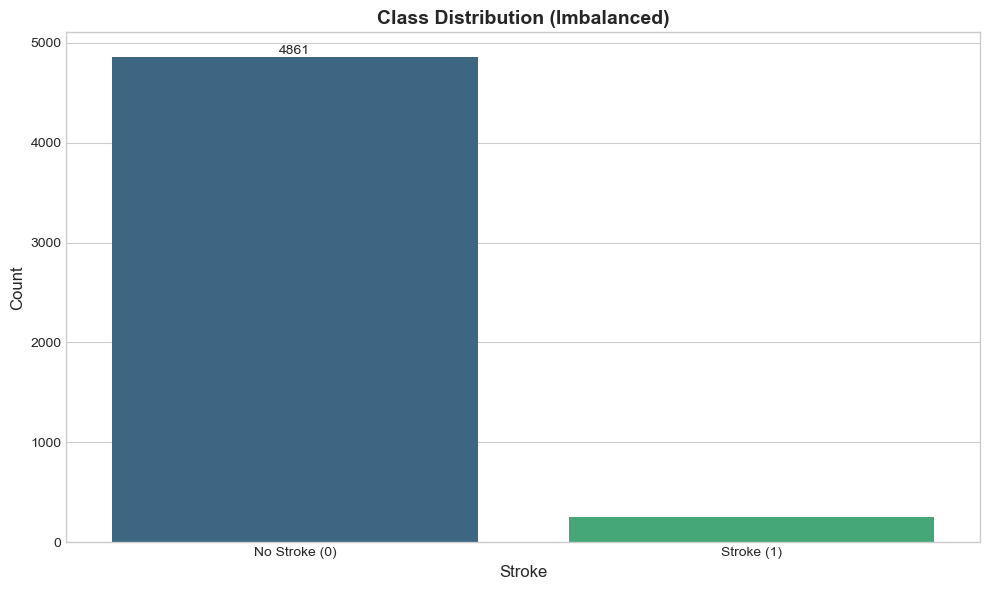

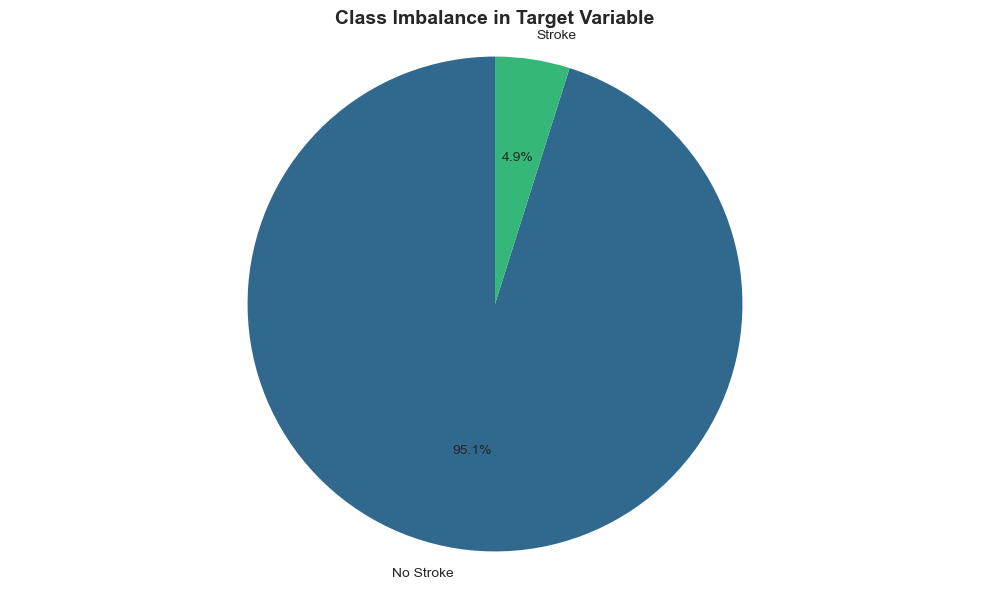

In [4]:
# 1. TARGET VARIABLE ANALYSIS
# ==========================
print("\n1. Analyzing Target Variable Distribution")

# Class distribution visualization
fig, ax = plt.subplots(figsize=(10, 6))
stroke_counts = df['stroke'].value_counts()
ax = sns.barplot(x=stroke_counts.index, y=stroke_counts.values, palette='viridis')
ax.bar_label(ax.containers[0], fmt='%d')
ax.set_xlabel('Stroke', fontsize=12)
ax.set_ylabel('Count', fontsize=12)
ax.set_title('Class Distribution (Imbalanced)', fontsize=14, fontweight='bold')
ax.set_xticklabels(['No Stroke (0)', 'Stroke (1)'])
plt.tight_layout()
plt.show()

# Pie chart for imbalance visualization
labels = ['No Stroke', 'Stroke']
sizes = stroke_counts.values
fig, ax = plt.subplots(figsize=(10, 6))
ax.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=sns.color_palette('viridis', 2))
ax.axis('equal')
ax.set_title('Class Imbalance in Target Variable', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


2. Analyzing Missing Values

Missing values count and percentage:


,Missing Values,Percentage
bmi,201,3.933464


<Figure size 1200x800 with 0 Axes>

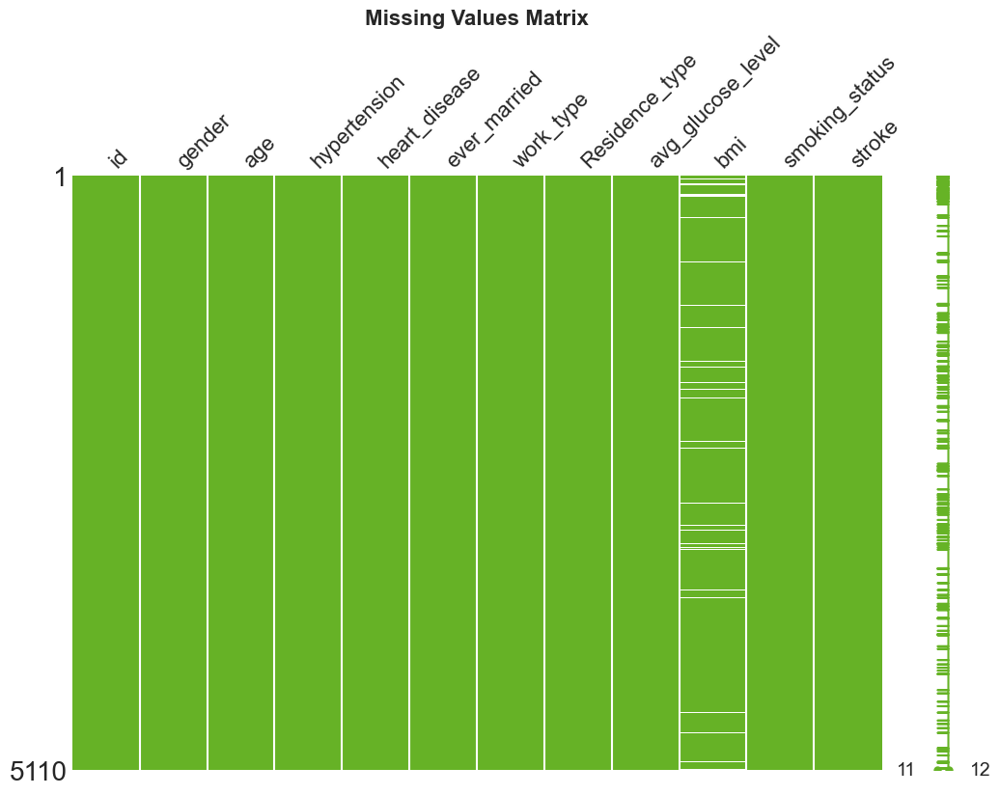

<Figure size 1200x800 with 0 Axes>

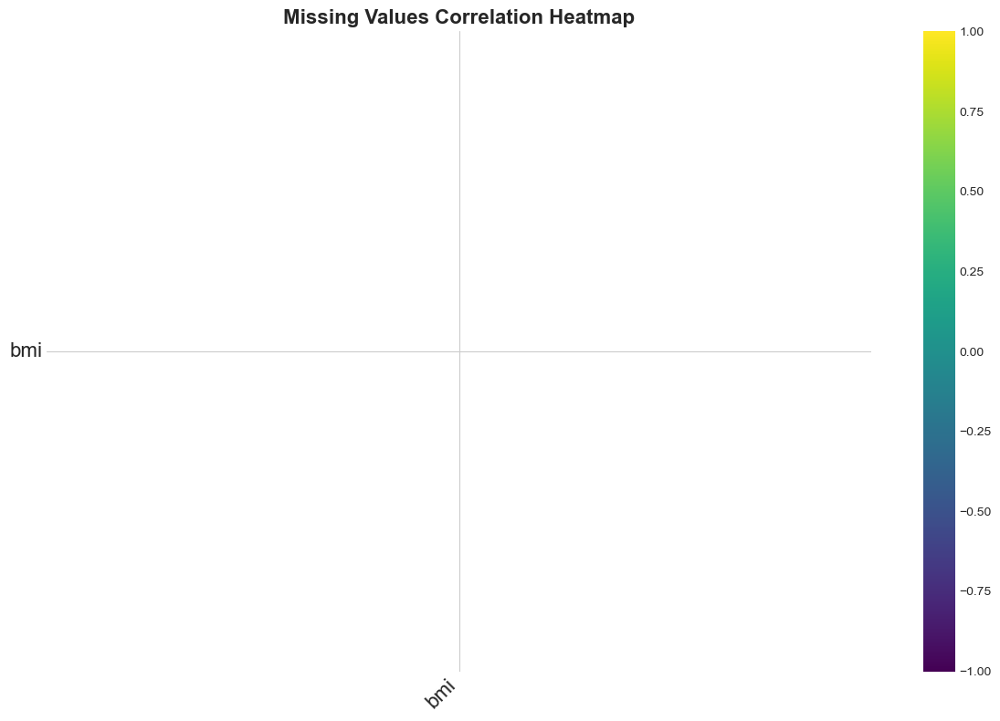

In [5]:
# 2. MISSING VALUE ANALYSIS
# =========================
print("\n2. Analyzing Missing Values")

# Check missing values
print("\nMissing values count and percentage:")
missing_data = pd.DataFrame({
    'Missing Values': df.isnull().sum(),
    'Percentage': df.isnull().sum() / len(df) * 100
})
display(missing_data[missing_data['Missing Values'] > 0])

# Missing values heatmap
plt.figure(figsize=(12, 8))
msno.matrix(df, figsize=(12, 8), color=(0.4, 0.7, 0.15))
plt.title('Missing Values Matrix', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# Missing values correlation heatmap
plt.figure(figsize=(12, 8))
msno.heatmap(df, figsize=(12, 8), cmap='viridis')
plt.title('Missing Values Correlation Heatmap', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()



3. Univariate Analysis - Numerical Variables


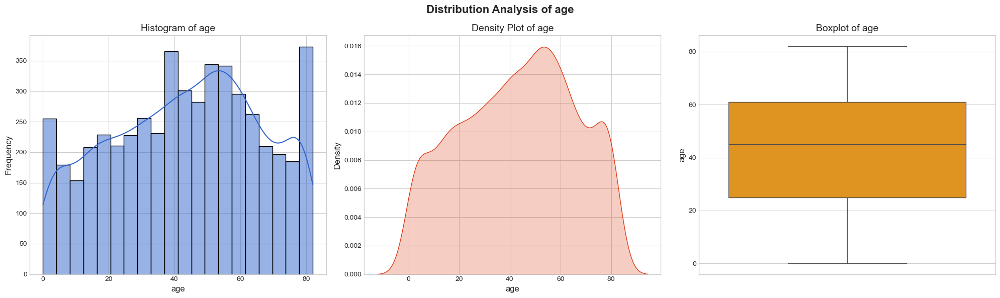

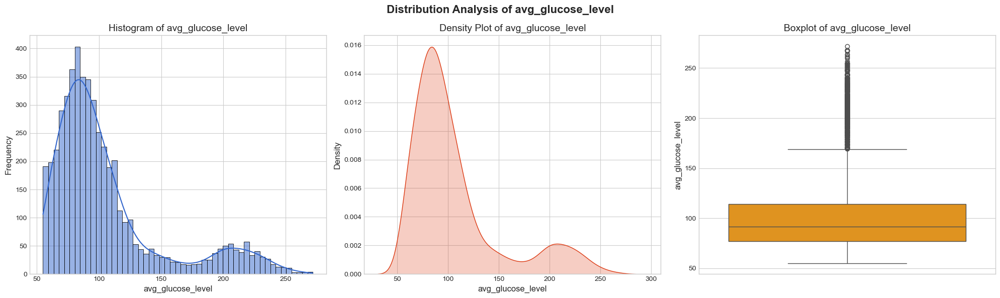

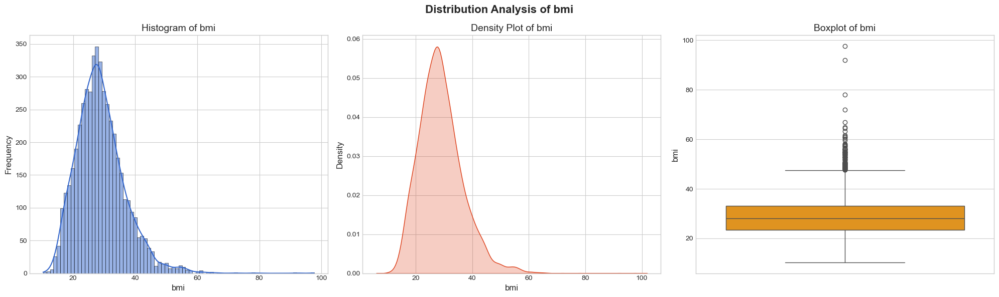

In [6]:
# 3. UNIVARIATE ANALYSIS - NUMERICAL VARIABLES
# =====================================
print("\n3. Univariate Analysis - Numerical Variables")

# Create histograms, density plots, and boxplots for numerical variables
for var in numerical_vars:
    # Handle missing values in BMI for visualization
    # Create a figure with 3 subplots
    fig, axes = plt.subplots(1, 3, figsize=(20, 6))
    
    # Histogram - need to pass the dataframe and specify the column
    sns.histplot(data=df, x=var, kde=True, ax=axes[0], color=colors[0])
    axes[0].set_title(f'Histogram of {var}', fontsize=14)
    axes[0].set_xlabel(var, fontsize=12)
    axes[0].set_ylabel('Frequency', fontsize=12)
    
    # Density plot - need to pass the dataframe and specify the column
    sns.kdeplot(data=df, x=var, fill=True, ax=axes[1], color=colors[1])
    axes[1].set_title(f'Density Plot of {var}', fontsize=14)
    axes[1].set_xlabel(var, fontsize=12)
    axes[1].set_ylabel('Density', fontsize=12)
    
    # Boxplot
    sns.boxplot(data=df, y=var, ax=axes[2], color=colors[2])
    axes[2].set_title(f'Boxplot of {var}', fontsize=14)
    axes[2].set_ylabel(var, fontsize=12)
    
    plt.suptitle(f'Distribution Analysis of {var}', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()


4. Univariate Analysis - Categorical Variables


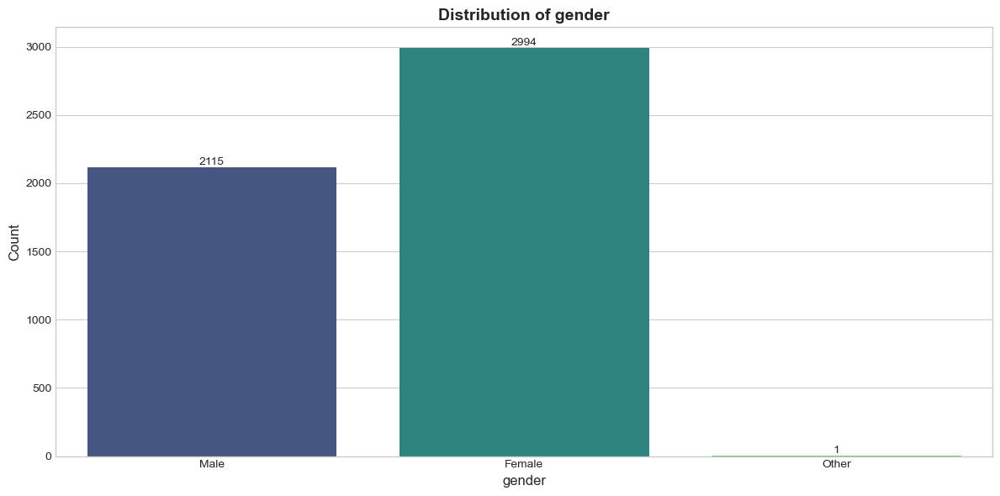

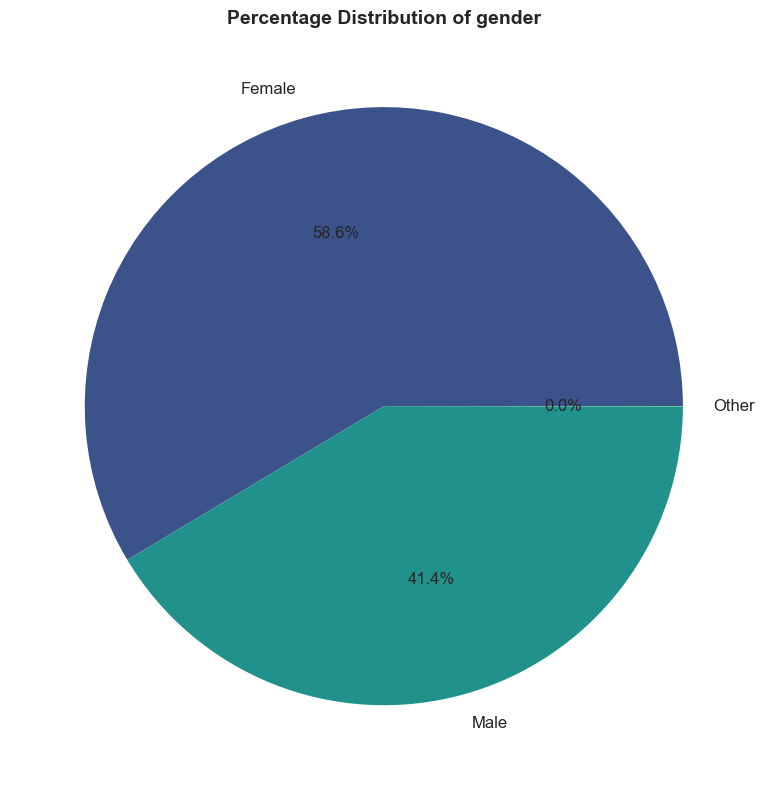

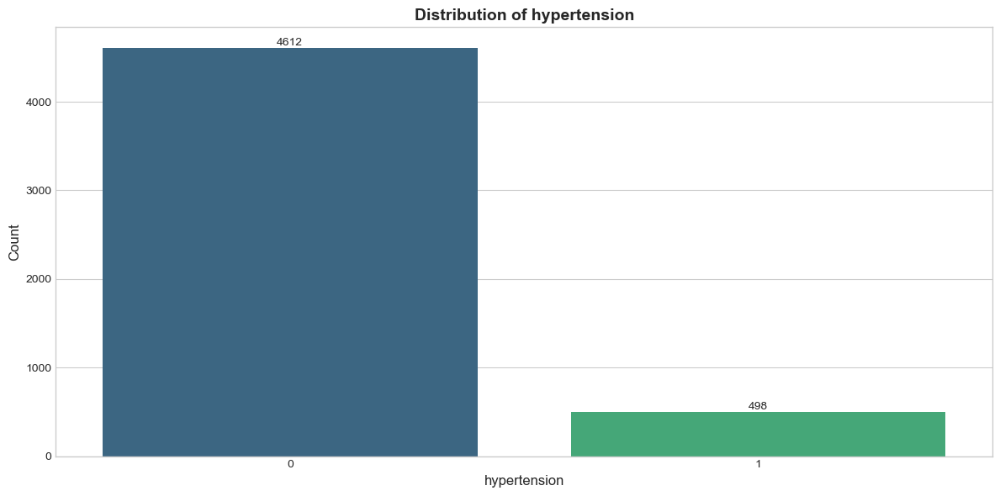

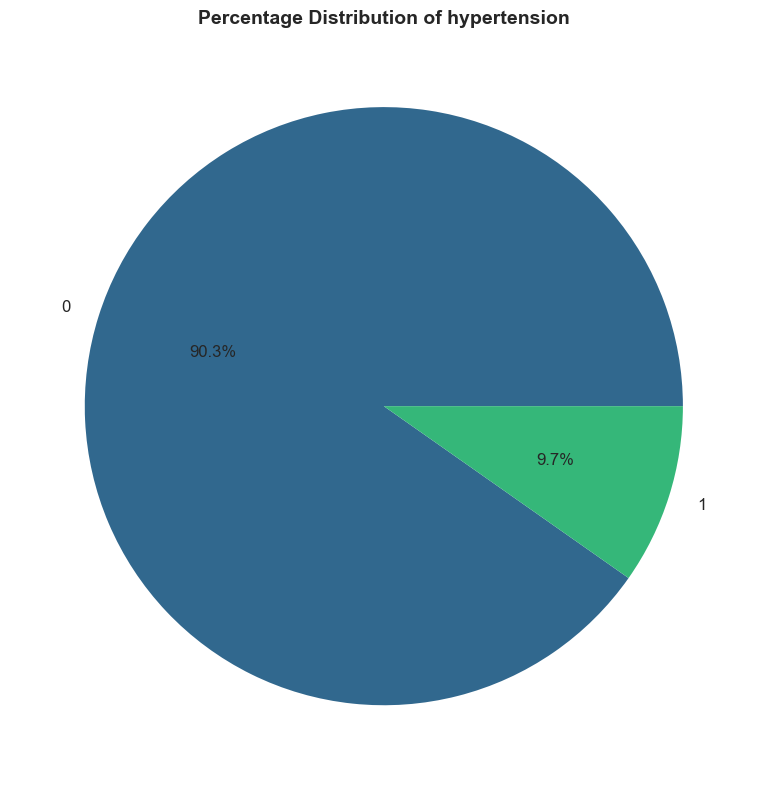

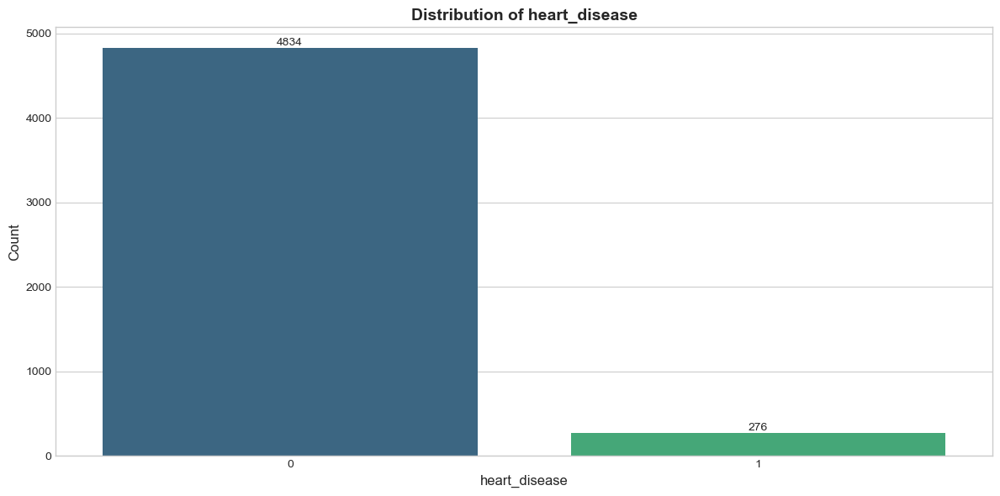

...

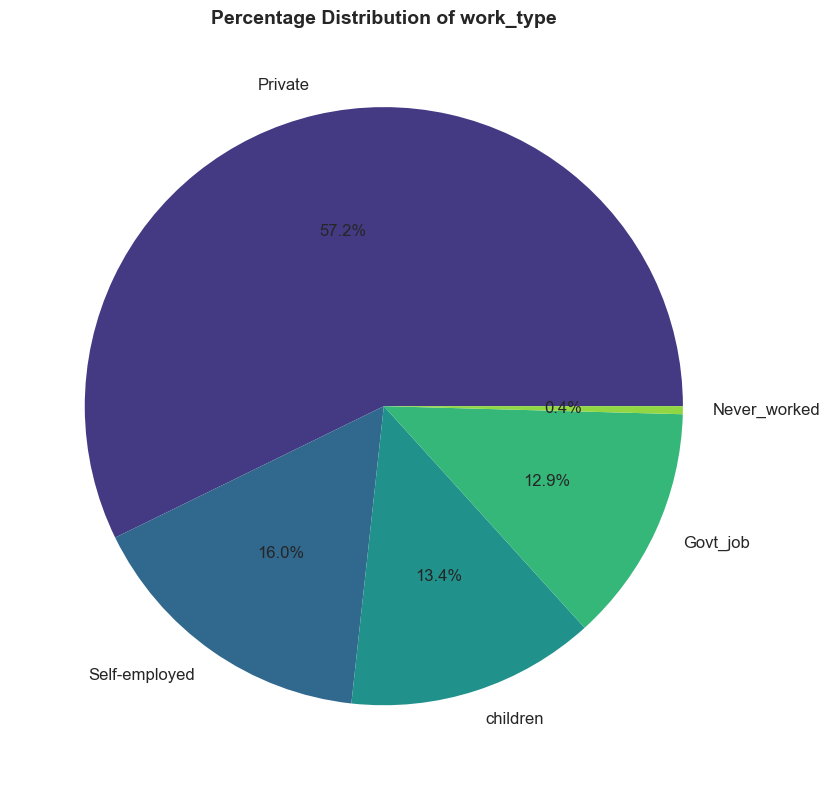

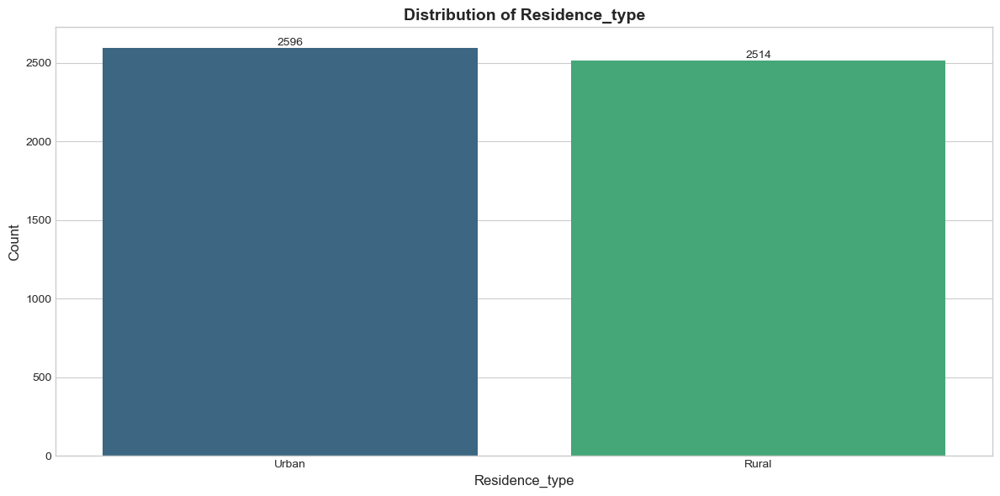

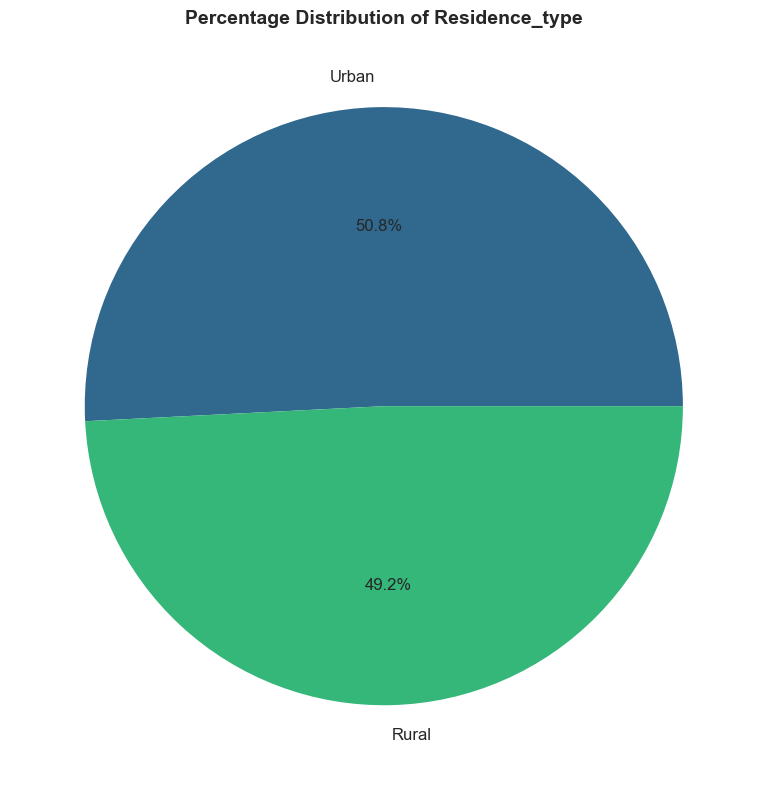

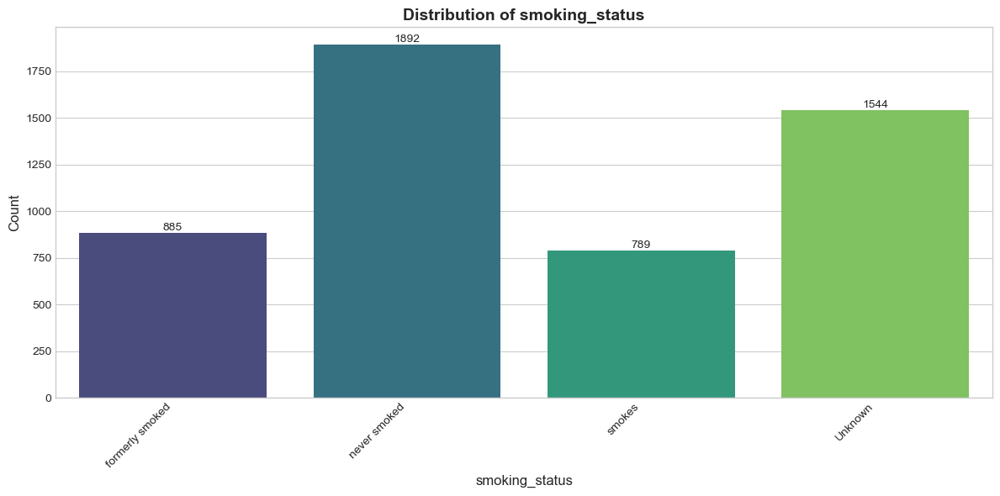

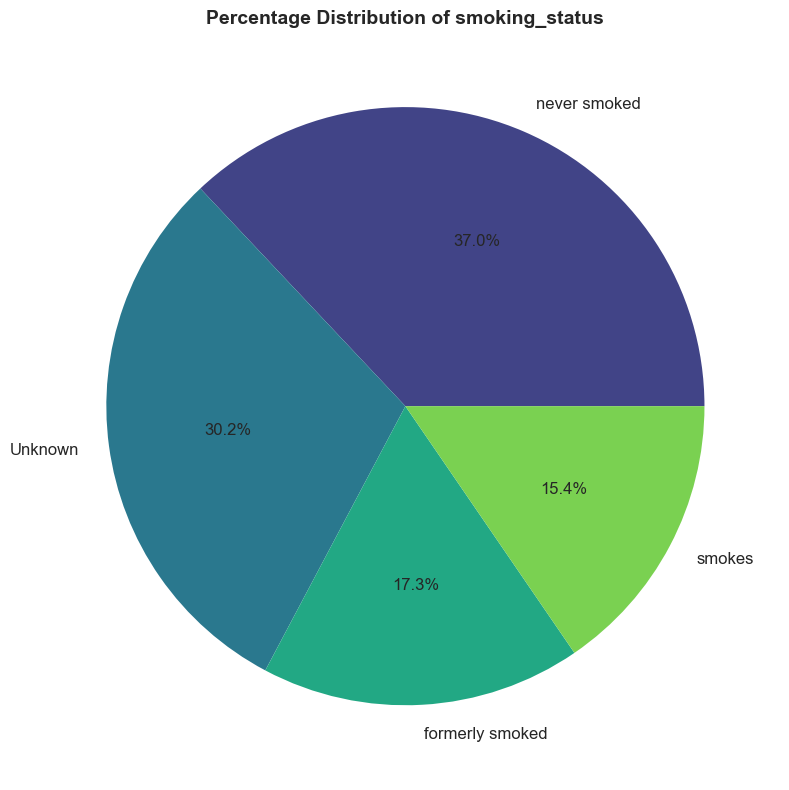

In [7]:
# 4. UNIVARIATE ANALYSIS - CATEGORICAL VARIABLES
# ==========================================
print("\n4. Univariate Analysis - Categorical Variables")

# Create bar charts and pie charts for categorical variables
for i, var in enumerate(categorical_vars):
    # Bar chart
    plt.figure(figsize=(12, 6))
    ax = sns.countplot(data=df, x=var, palette='viridis')
    ax.set_title(f'Distribution of {var}', fontsize=14, fontweight='bold')
    ax.set_xlabel(var, fontsize=12)
    ax.set_ylabel('Count', fontsize=12)
    
    # Add count labels on top of bars
    for p in ax.patches:
        ax.annotate(f'{int(p.get_height())}', 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha = 'center', va = 'bottom', fontsize=10)
    
    # Rotate x-labels if needed
    if var in ['work_type', 'smoking_status']:
        plt.xticks(rotation=45, ha='right')
    
    plt.tight_layout()
    plt.show()
    
    # Pie chart
    plt.figure(figsize=(10, 8))
    df[var].value_counts().plot(kind='pie', autopct='%1.1f%%', 
                               textprops={'fontsize': 12}, 
                               colors=sns.color_palette('viridis', df[var].nunique()))
    plt.title(f'Percentage Distribution of {var}', fontsize=14, fontweight='bold')
    plt.ylabel('')  # Hide the 'None' ylabel
    plt.tight_layout()
    plt.show()


5. Bivariate Analysis - Numerical Variables vs. Target


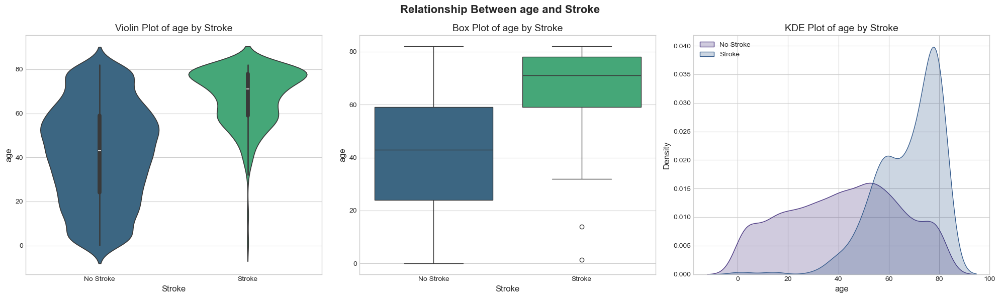

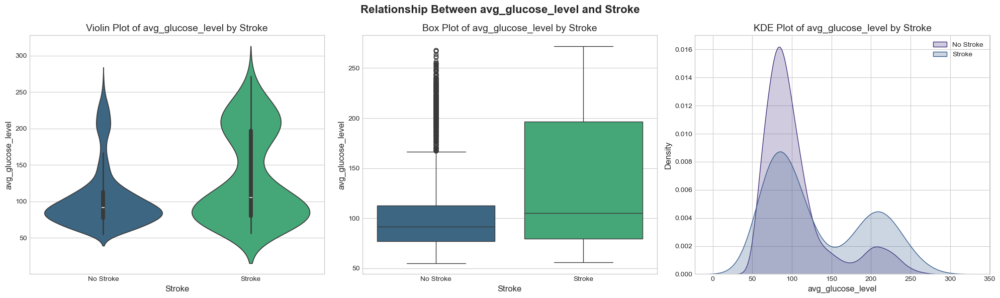

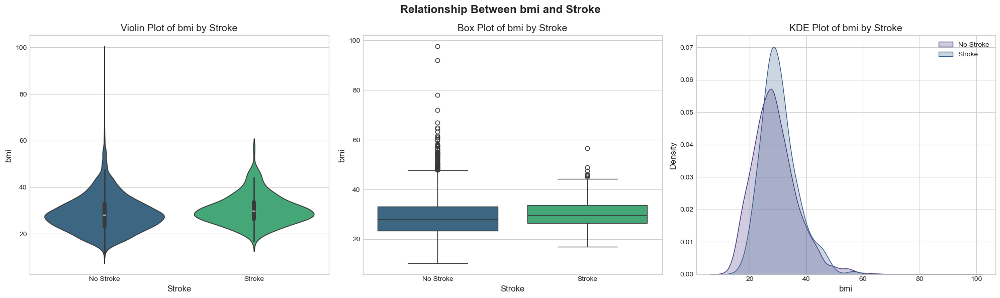

In [8]:
# 5. BIVARIATE ANALYSIS - NUMERICAL VS TARGET
# =======================================
print("\n5. Bivariate Analysis - Numerical Variables vs. Target")

for var in numerical_vars:
    if var == 'bmi':
        # Handle missing values for visualization
        temp_df = df.dropna(subset=['bmi'])
    else:
        temp_df = df.copy()
    
    # Create a figure with multiple plots
    fig, axes = plt.subplots(1, 3, figsize=(20, 6))
    
    # Violin plot
    sns.violinplot(data=temp_df, x='stroke', y=var, palette='viridis', ax=axes[0])
    axes[0].set_title(f'Violin Plot of {var} by Stroke', fontsize=14)
    axes[0].set_xlabel('Stroke', fontsize=12)
    axes[0].set_ylabel(var, fontsize=12)
    axes[0].set_xticklabels(['No Stroke', 'Stroke'])
    
    # Box plot
    sns.boxplot(data=temp_df, x='stroke', y=var, palette='viridis', ax=axes[1])
    axes[1].set_title(f'Box Plot of {var} by Stroke', fontsize=14)
    axes[1].set_xlabel('Stroke', fontsize=12)
    axes[1].set_ylabel(var, fontsize=12)
    axes[1].set_xticklabels(['No Stroke', 'Stroke'])
    
    # KDE plot
    sns.kdeplot(data=temp_df[temp_df['stroke']==0][var], 
               label='No Stroke', shade=True, ax=axes[2])
    sns.kdeplot(data=temp_df[temp_df['stroke']==1][var], 
               label='Stroke', shade=True, ax=axes[2])
    axes[2].set_title(f'KDE Plot of {var} by Stroke', fontsize=14)
    axes[2].set_xlabel(var, fontsize=12)
    axes[2].set_ylabel('Density', fontsize=12)
    axes[2].legend()
    
    plt.suptitle(f'Relationship Between {var} and Stroke', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()


6. Bivariate Analysis - Categorical Variables vs. Target


<Figure size 1200x600 with 0 Axes>

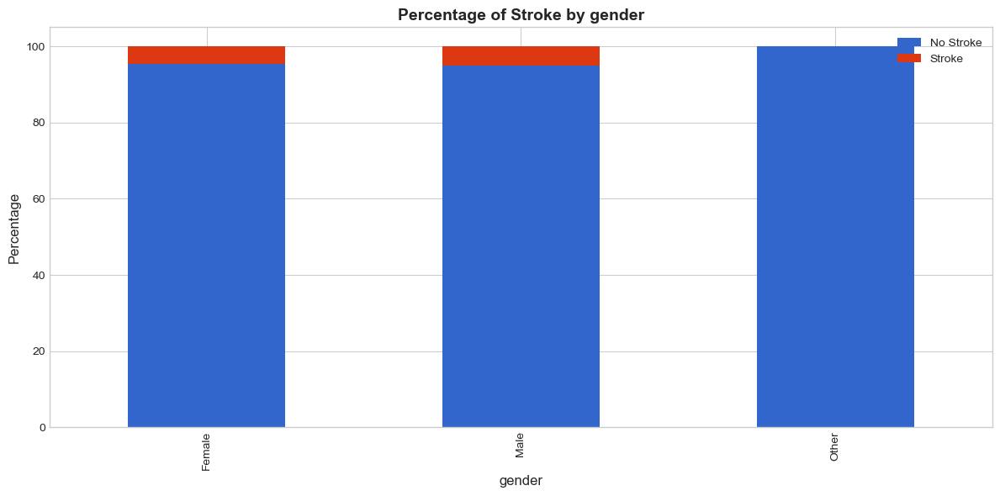

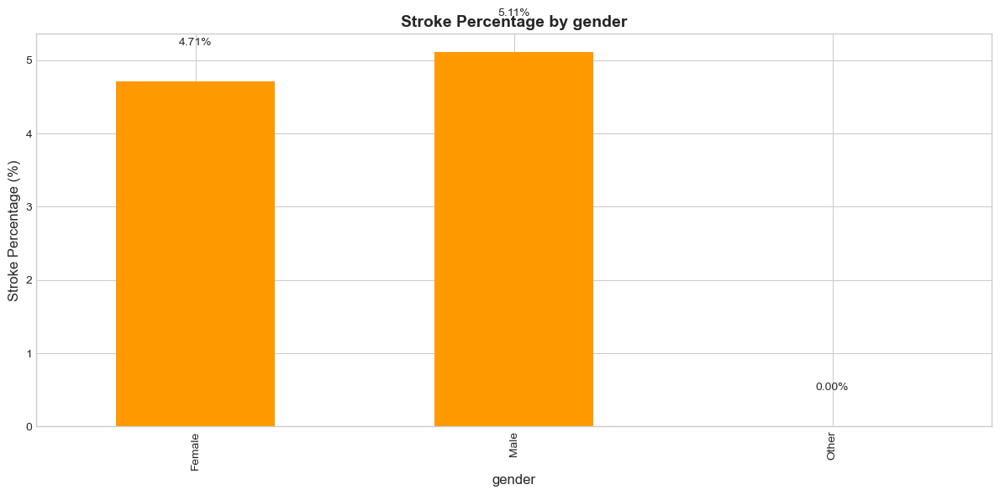

<Figure size 1200x600 with 0 Axes>

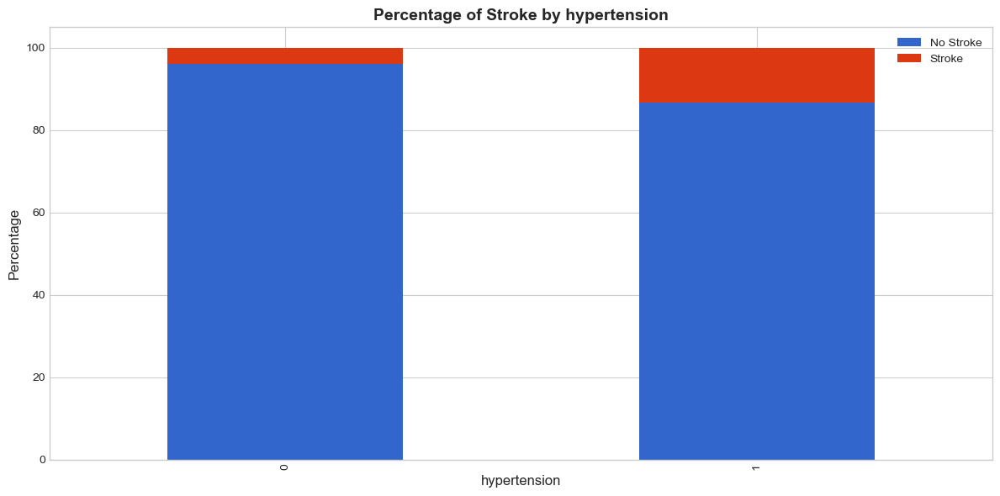

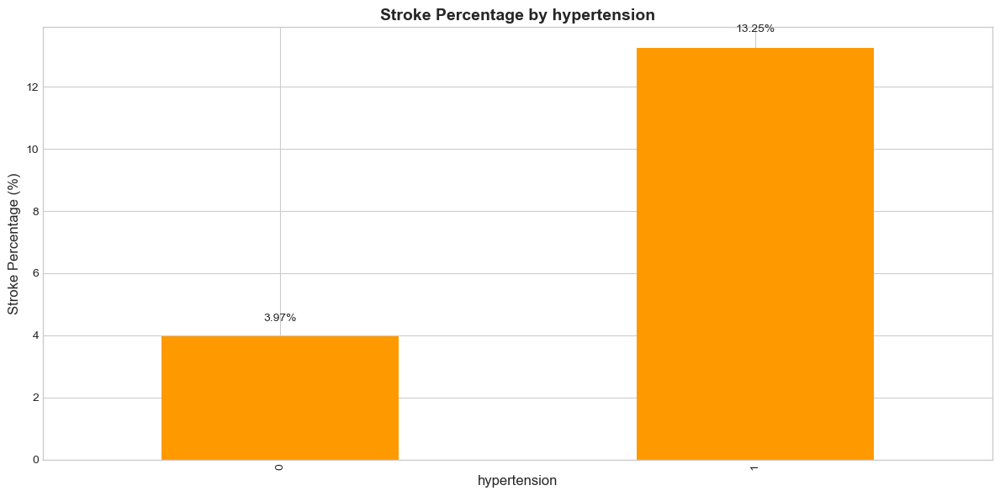

<Figure size 1200x600 with 0 Axes>

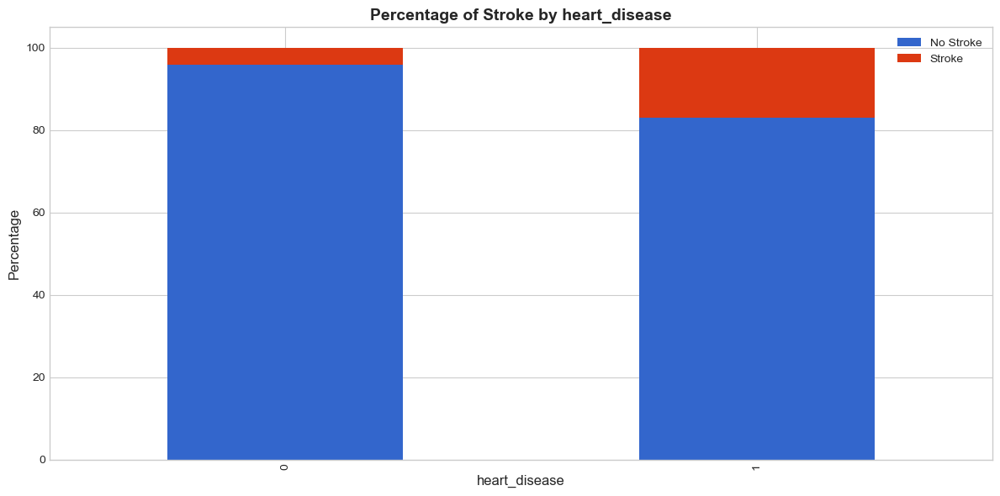

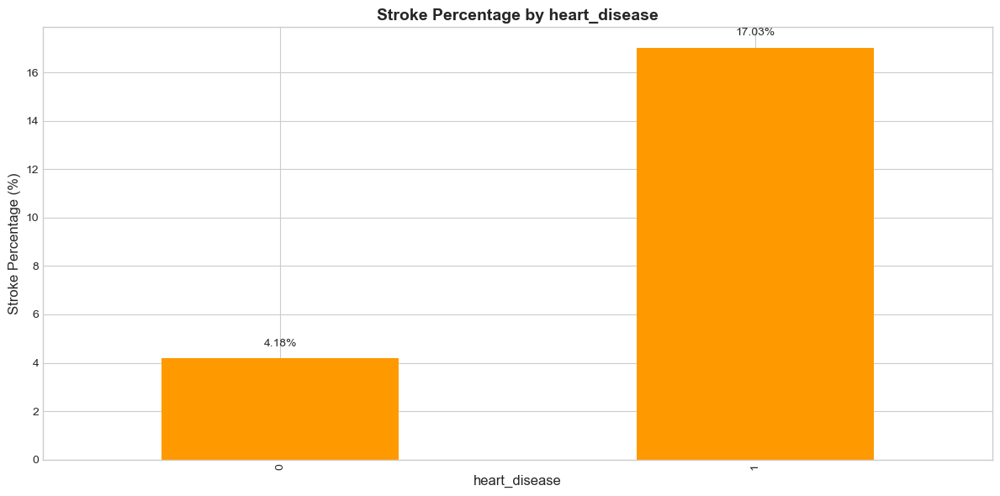

<Figure size 1200x600 with 0 Axes>

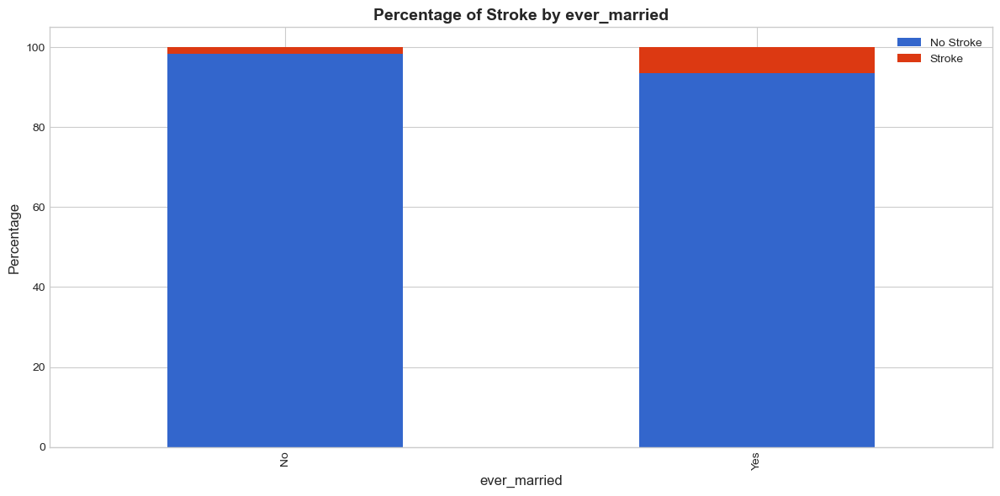

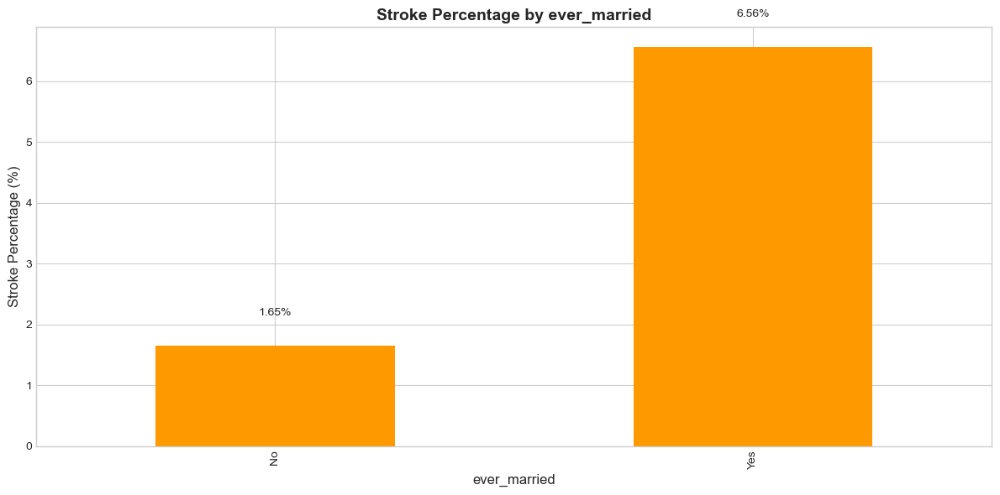

<Figure size 1200x600 with 0 Axes>

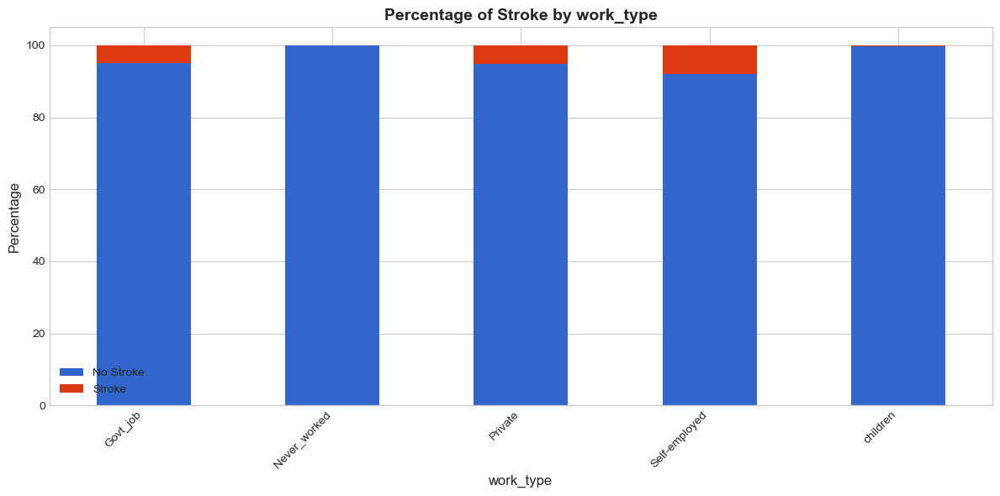

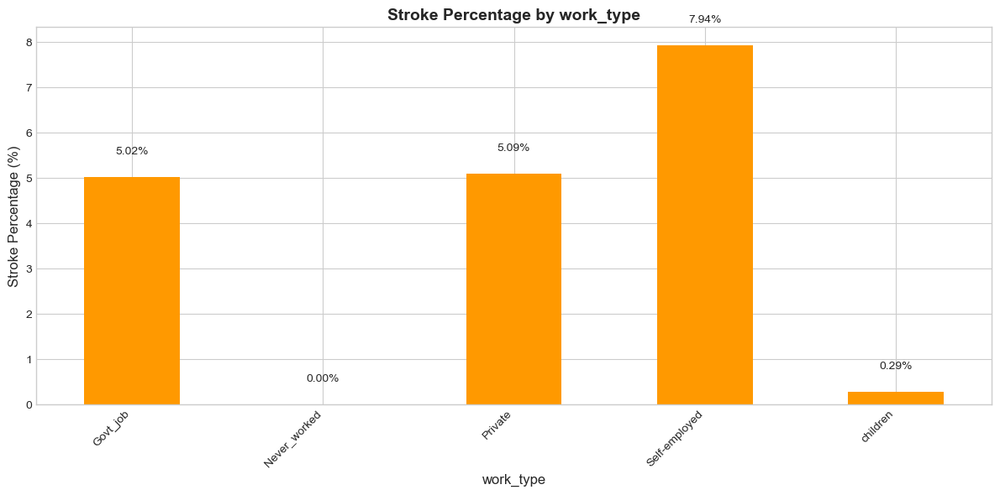

<Figure size 1200x600 with 0 Axes>

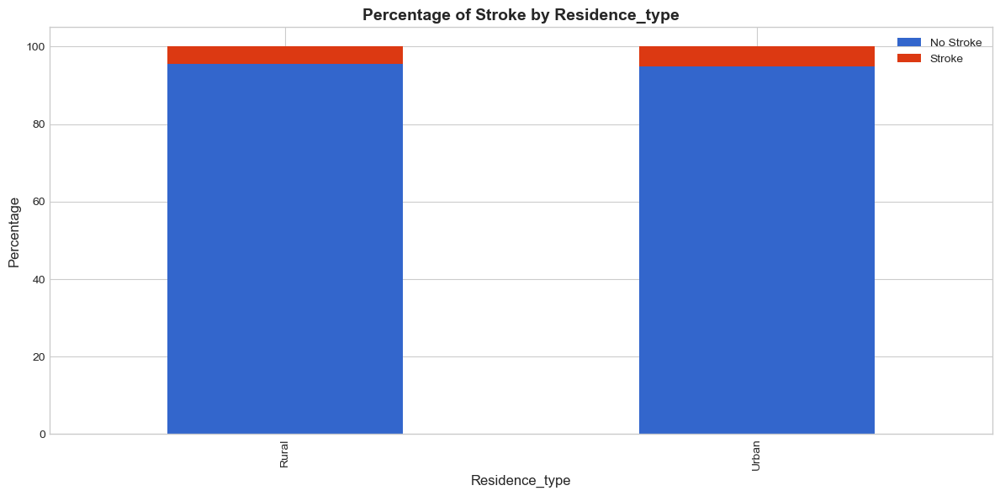

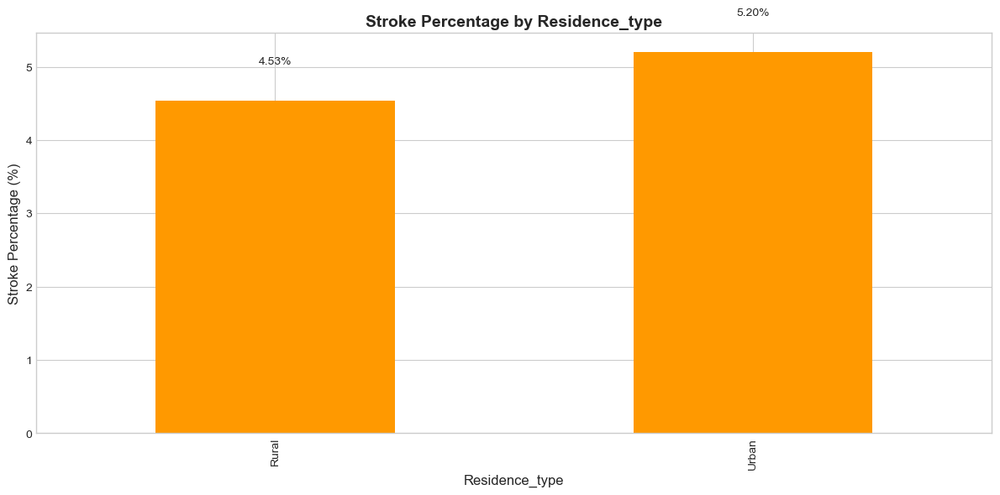

<Figure size 1200x600 with 0 Axes>

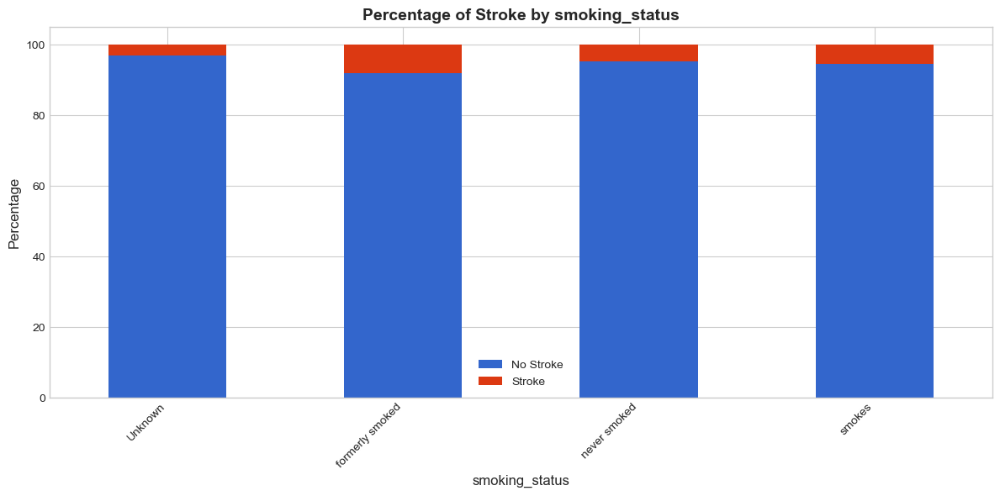

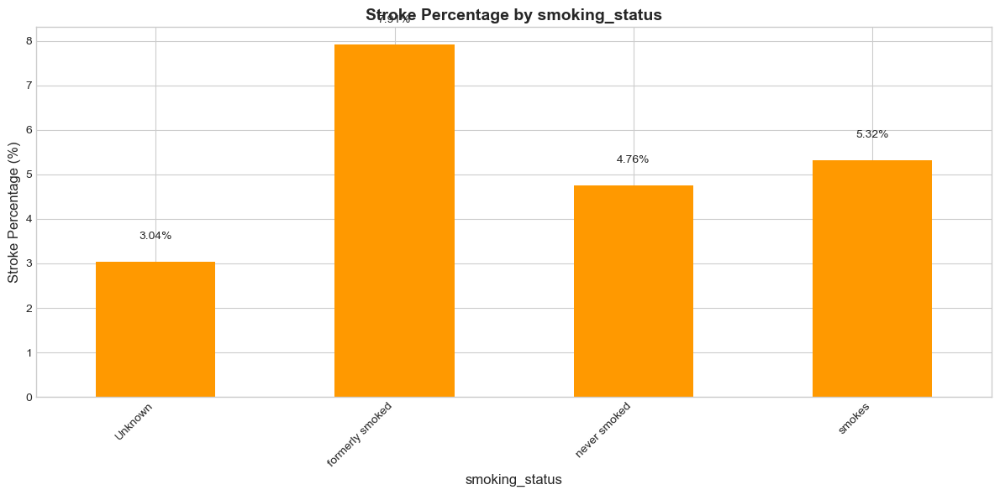

In [9]:
# 6. BIVARIATE ANALYSIS - CATEGORICAL VS TARGET
# ========================================
print("\n6. Bivariate Analysis - Categorical Variables vs. Target")

for var in categorical_vars:
    # Calculate percentages of stroke for each category
    category_stroke_pct = df.groupby(var)['stroke'].mean() * 100
    
    # Stacked bar chart
    plt.figure(figsize=(12, 6))
    cross_tab = pd.crosstab(df[var], df['stroke'])
    cross_tab_pct = cross_tab.div(cross_tab.sum(axis=1), axis=0) * 100
    
    ax = cross_tab_pct.plot(kind='bar', stacked=True, figsize=(12, 6), 
                          color=[colors[0], colors[1]])
    ax.set_xlabel(var, fontsize=12)
    ax.set_ylabel('Percentage', fontsize=12)
    ax.set_title(f'Percentage of Stroke by {var}', fontsize=14, fontweight='bold')
    ax.legend(['No Stroke', 'Stroke'])
    
    # Rotate x-labels if needed
    if var in ['work_type', 'smoking_status']:
        plt.xticks(rotation=45, ha='right')
    
    plt.tight_layout()
    plt.show()
    
    # Bar chart showing percentage of stroke by category
    plt.figure(figsize=(12, 6))
    ax = category_stroke_pct.plot(kind='bar', figsize=(12, 6), color=colors[2])
    ax.set_xlabel(var, fontsize=12)
    ax.set_ylabel('Stroke Percentage (%)', fontsize=12)
    ax.set_title(f'Stroke Percentage by {var}', fontsize=14, fontweight='bold')
    
    # Add percentage labels on top of bars
    for i, v in enumerate(category_stroke_pct):
        ax.text(i, v + 0.5, f'{v:.2f}%', ha='center', fontsize=10)
    
    # Rotate x-labels if needed
    if var in ['work_type', 'smoking_status']:
        plt.xticks(rotation=45, ha='right')
    
    plt.tight_layout()
    plt.show()


7. Age Group Analysis


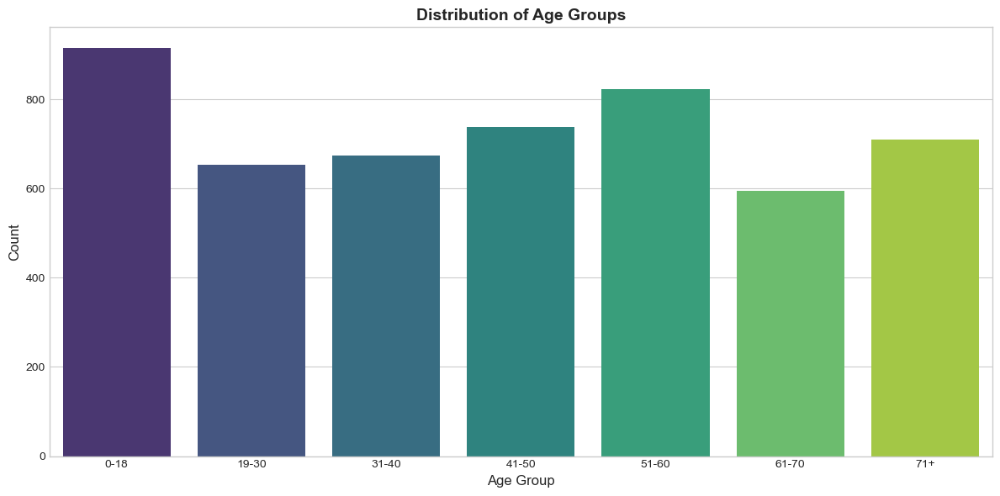

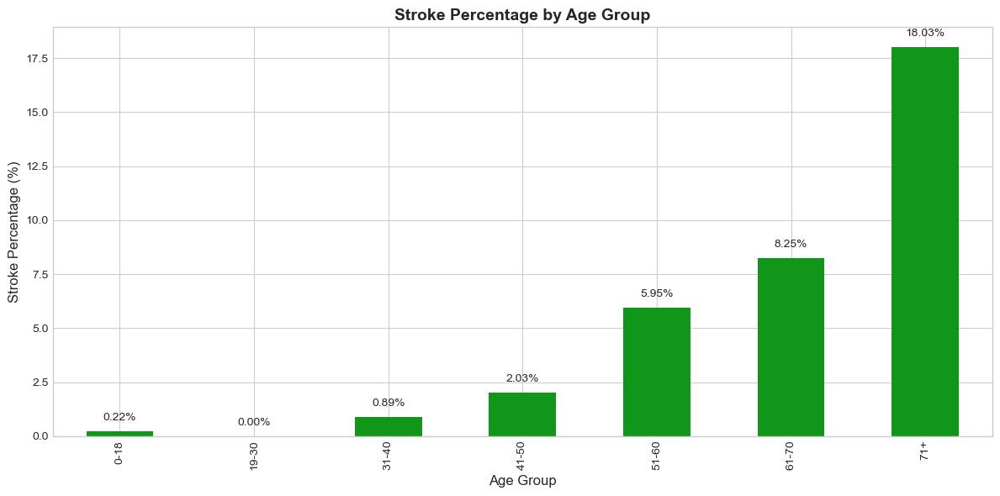

In [10]:
# 7. AGE GROUP ANALYSIS
# =================
print("\n7. Age Group Analysis")

# Create age groups
df['age_group'] = pd.cut(df['age'], 
                        bins=[0, 18, 30, 40, 50, 60, 70, 100],
                        labels=['0-18', '19-30', '31-40', '41-50', '51-60', '61-70', '71+'])

# Age group distribution
plt.figure(figsize=(12, 6))
sns.countplot(data=df, x='age_group', palette='viridis')
plt.title('Distribution of Age Groups', fontsize=14, fontweight='bold')
plt.xlabel('Age Group', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.tight_layout()
plt.show()

# Stroke percentage by age group
age_stroke_pct = df.groupby('age_group')['stroke'].mean() * 100

plt.figure(figsize=(12, 6))
ax = age_stroke_pct.plot(kind='bar', figsize=(12, 6), color=colors[3])
ax.set_xlabel('Age Group', fontsize=12)
ax.set_ylabel('Stroke Percentage (%)', fontsize=12)
ax.set_title('Stroke Percentage by Age Group', fontsize=14, fontweight='bold')

# Add percentage labels on top of bars
for i, v in enumerate(age_stroke_pct):
    ax.text(i, v + 0.5, f'{v:.2f}%', ha='center', fontsize=10)

plt.tight_layout()
plt.show()


8. Correlation Analysis


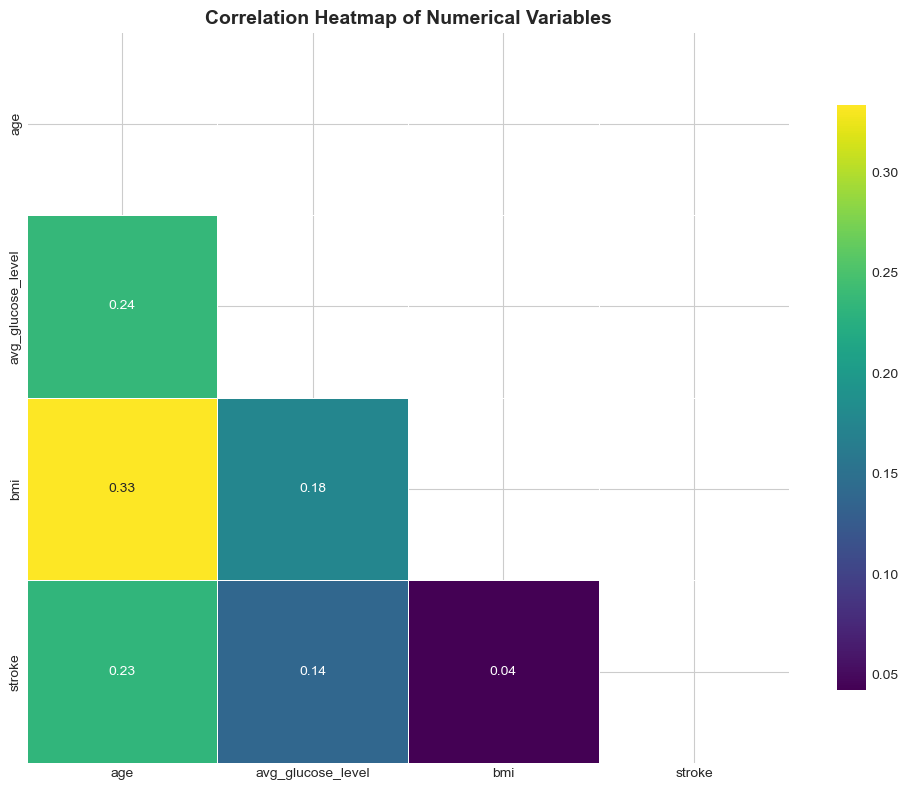

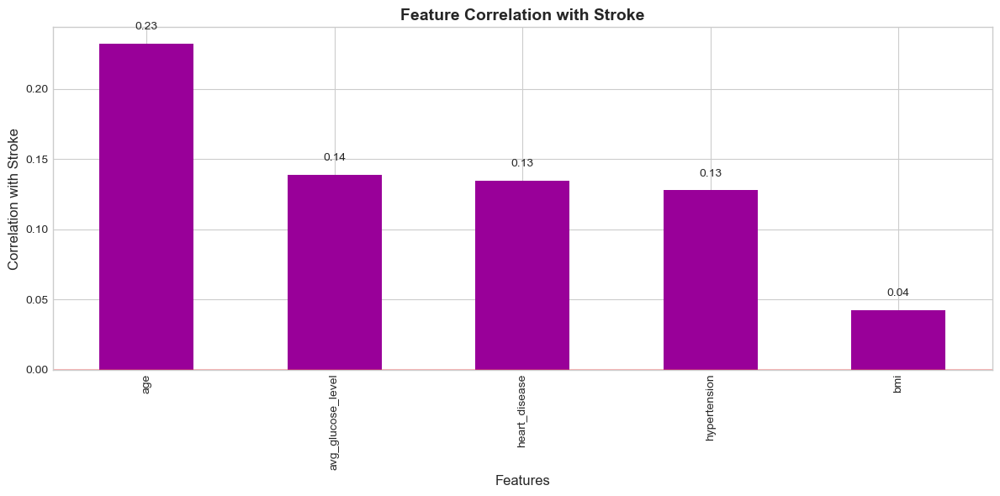

In [11]:
# 8. CORRELATION ANALYSIS
# ===================
print("\n8. Correlation Analysis")

# Correlation heatmap for numerical variables
numerical_df = df[numerical_vars + ['stroke']].copy()
numerical_df = numerical_df.dropna()  # Drop rows with missing values for correlation

# Compute correlation matrix
corr_matrix = numerical_df.corr()

# Plot correlation heatmap
plt.figure(figsize=(10, 8))
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='viridis', 
           mask=mask, linewidths=0.5, cbar_kws={"shrink": .8})
plt.title('Correlation Heatmap of Numerical Variables', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Correlation with stroke - for all numeric and binary variables
binary_df = df[binary_vars].copy()
for var in binary_vars:
    binary_df[var] = binary_df[var].astype(int)

# Combine numerical and binary variables
correlation_df = pd.concat([df[numerical_vars].dropna(), binary_df], axis=1)
correlation_with_stroke = correlation_df.corr()['stroke'].sort_values(ascending=False)

plt.figure(figsize=(12, 6))
ax = correlation_with_stroke.drop('stroke').plot(kind='bar', figsize=(12, 6), color=colors[4])
ax.set_xlabel('Features', fontsize=12)
ax.set_ylabel('Correlation with Stroke', fontsize=12)
ax.set_title('Feature Correlation with Stroke', fontsize=14, fontweight='bold')
plt.axhline(y=0, color='r', linestyle='-', alpha=0.3)

# Add correlation values on top of bars
for i, v in enumerate(correlation_with_stroke.drop('stroke')):
    if v >= 0:
        ax.text(i, v + 0.01, f'{v:.2f}', ha='center', fontsize=10)
    else:
        ax.text(i, v - 0.02, f'{v:.2f}', ha='center', fontsize=10)

plt.tight_layout()
plt.show()


9. Medical Condition Analysis


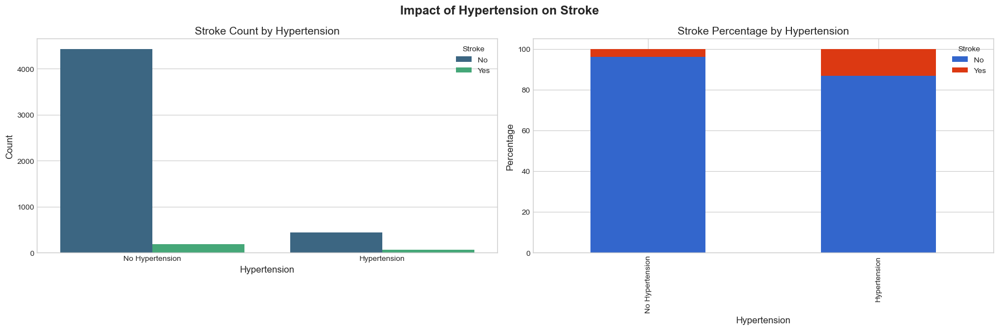

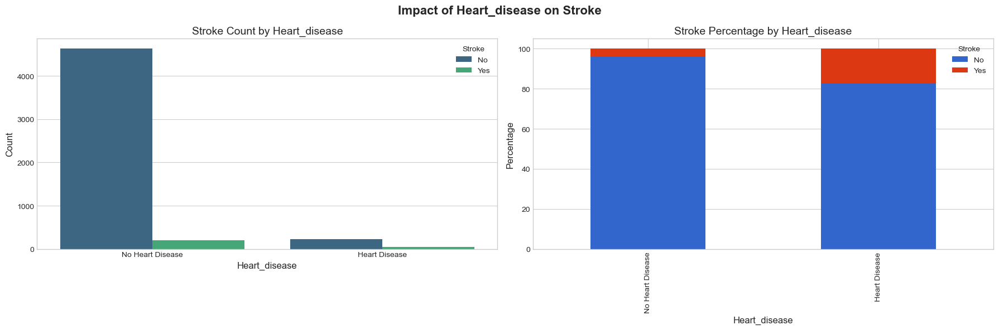

In [12]:
# 9. MEDICAL CONDITION ANALYSIS
# =========================
print("\n9. Medical Condition Analysis")

# Hypertension and Heart Disease vs Stroke
conditions = ['hypertension', 'heart_disease']
for condition in conditions:
    # Create a crosstab
    cross_tab = pd.crosstab(df[condition], df['stroke'])
    cross_tab_pct = cross_tab.div(cross_tab.sum(axis=1), axis=0) * 100
    
    fig, axes = plt.subplots(1, 2, figsize=(18, 6))
    
    # Count plot
    sns.countplot(data=df, x=condition, hue='stroke', palette='viridis', ax=axes[0])
    axes[0].set_title(f'Stroke Count by {condition.capitalize()}', fontsize=14)
    axes[0].set_xlabel(condition.capitalize(), fontsize=12)
    axes[0].set_ylabel('Count', fontsize=12)
    axes[0].legend(title='Stroke', labels=['No', 'Yes'])
    
    # Convert 0/1 to No/Yes for better visualization
    if condition == 'hypertension':
        axes[0].set_xticklabels(['No Hypertension', 'Hypertension'])
    elif condition == 'heart_disease':
        axes[0].set_xticklabels(['No Heart Disease', 'Heart Disease'])
    
    # Stacked percentage
    cross_tab_pct.plot(kind='bar', stacked=True, ax=axes[1], color=[colors[0], colors[1]])
    axes[1].set_title(f'Stroke Percentage by {condition.capitalize()}', fontsize=14)
    axes[1].set_xlabel(condition.capitalize(), fontsize=12)
    axes[1].set_ylabel('Percentage', fontsize=12)
    axes[1].legend(title='Stroke', labels=['No', 'Yes'])
    
    # Convert 0/1 to No/Yes for better visualization
    if condition == 'hypertension':
        axes[1].set_xticklabels(['No Hypertension', 'Hypertension'])
    elif condition == 'heart_disease':
        axes[1].set_xticklabels(['No Heart Disease', 'Heart Disease'])
    
    plt.suptitle(f'Impact of {condition.capitalize()} on Stroke', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()



10. Glucose Level Analysis


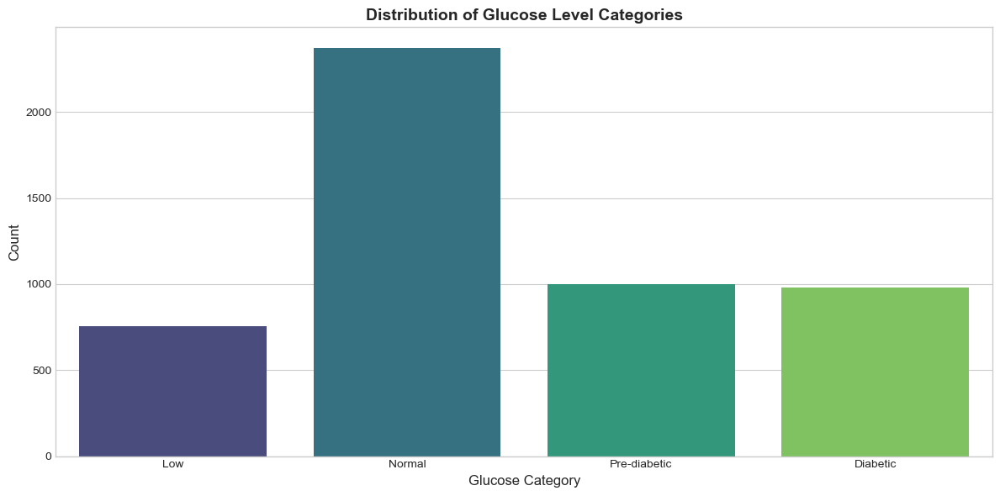

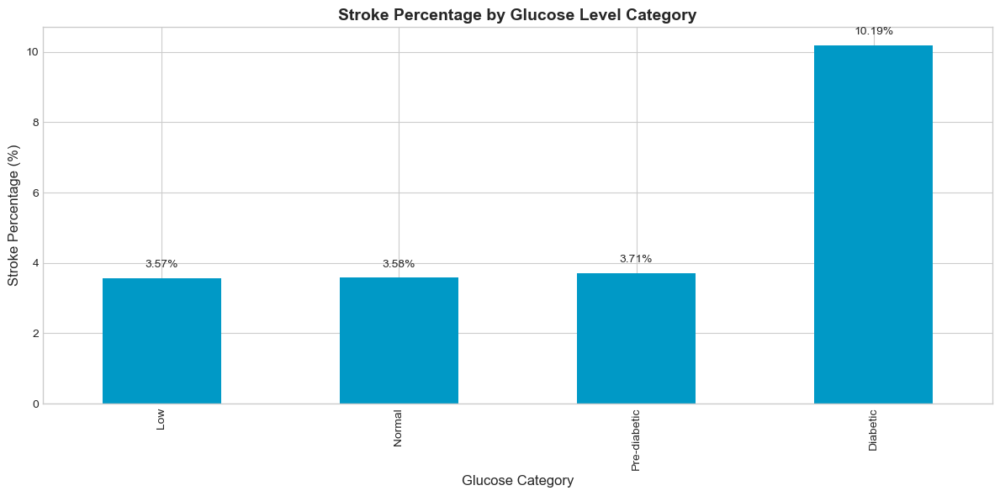

In [13]:
# 10. GLUCOSE LEVEL ANALYSIS
# ======================
print("\n10. Glucose Level Analysis")

# Create glucose level categories based on medical standards
df['glucose_category'] = pd.cut(df['avg_glucose_level'], 
                              bins=[0, 70, 100, 126, 300],
                              labels=['Low', 'Normal', 'Pre-diabetic', 'Diabetic'])

# Distribution of glucose categories
plt.figure(figsize=(12, 6))
sns.countplot(data=df, x='glucose_category', palette='viridis')
plt.title('Distribution of Glucose Level Categories', fontsize=14, fontweight='bold')
plt.xlabel('Glucose Category', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.tight_layout()
plt.show()

# Stroke percentage by glucose category
glucose_stroke_pct = df.groupby('glucose_category')['stroke'].mean() * 100

plt.figure(figsize=(12, 6))
ax = glucose_stroke_pct.plot(kind='bar', figsize=(12, 6), color=colors[5])
ax.set_xlabel('Glucose Category', fontsize=12)
ax.set_ylabel('Stroke Percentage (%)', fontsize=12)
ax.set_title('Stroke Percentage by Glucose Level Category', fontsize=14, fontweight='bold')

# Add percentage labels on top of bars
for i, v in enumerate(glucose_stroke_pct):
    ax.text(i, v + 0.3, f'{v:.2f}%', ha='center', fontsize=10)

plt.tight_layout()
plt.show()




11. BMI Analysis


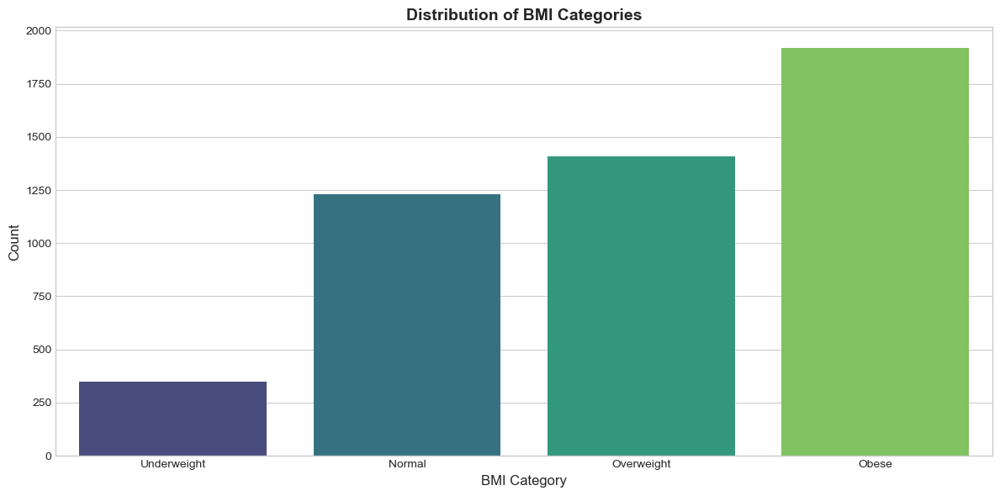

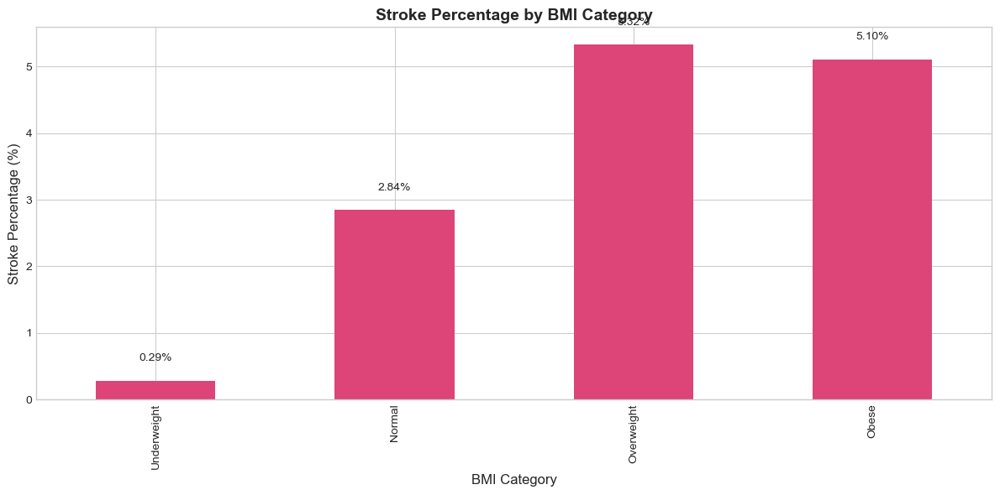

In [14]:
# 11. BMI ANALYSIS
# ===========
print("\n11. BMI Analysis")

# Handle missing values to visualize BMI distribution
df_bmi = df.dropna(subset=['bmi'])

# Create BMI categories based on WHO standards
df_bmi['bmi_category'] = pd.cut(df_bmi['bmi'], 
                              bins=[0, 18.5, 24.9, 29.9, 100],
                              labels=['Underweight', 'Normal', 'Overweight', 'Obese'])

# Distribution of BMI categories
plt.figure(figsize=(12, 6))
sns.countplot(data=df_bmi, x='bmi_category', palette='viridis')
plt.title('Distribution of BMI Categories', fontsize=14, fontweight='bold')
plt.xlabel('BMI Category', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.tight_layout()
plt.show()

# Stroke percentage by BMI category
bmi_stroke_pct = df_bmi.groupby('bmi_category')['stroke'].mean() * 100

plt.figure(figsize=(12, 6))
ax = bmi_stroke_pct.plot(kind='bar', figsize=(12, 6), color=colors[6])
ax.set_xlabel('BMI Category', fontsize=12)
ax.set_ylabel('Stroke Percentage (%)', fontsize=12)
ax.set_title('Stroke Percentage by BMI Category', fontsize=14, fontweight='bold')

# Add percentage labels on top of bars
for i, v in enumerate(bmi_stroke_pct):
    ax.text(i, v + 0.3, f'{v:.2f}%', ha='center', fontsize=10)

plt.tight_layout()
plt.show()


12. Smoking Status Analysis


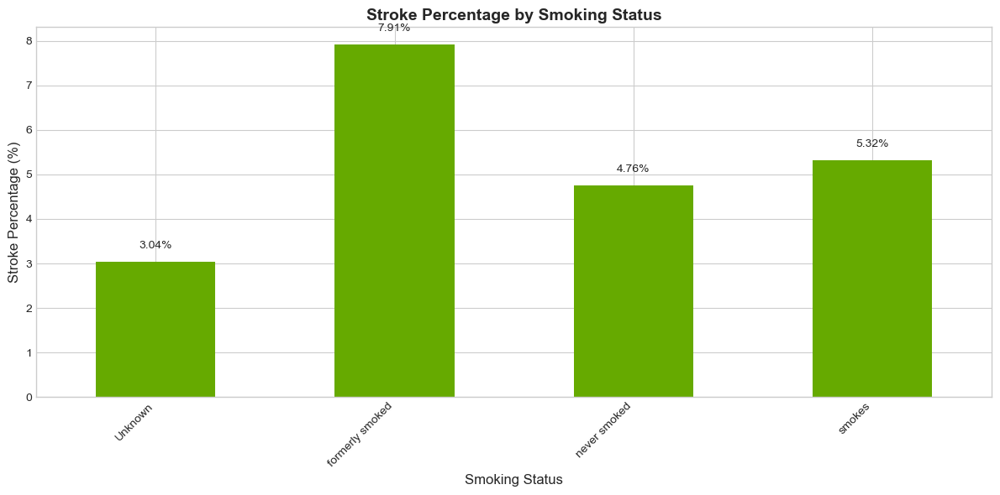

In [15]:
# 12. SMOKING STATUS ANALYSIS
# =======================
print("\n12. Smoking Status Analysis")

# Visualize stroke percentage by smoking status
smoking_stroke_pct = df.groupby('smoking_status')['stroke'].mean() * 100

plt.figure(figsize=(12, 6))
ax = smoking_stroke_pct.plot(kind='bar', figsize=(12, 6), color=colors[7])
ax.set_xlabel('Smoking Status', fontsize=12)
ax.set_ylabel('Stroke Percentage (%)', fontsize=12)
ax.set_title('Stroke Percentage by Smoking Status', fontsize=14, fontweight='bold')

# Add percentage labels on top of bars
for i, v in enumerate(smoking_stroke_pct):
    ax.text(i, v + 0.3, f'{v:.2f}%', ha='center', fontsize=10)

plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


13. Work Type Analysis


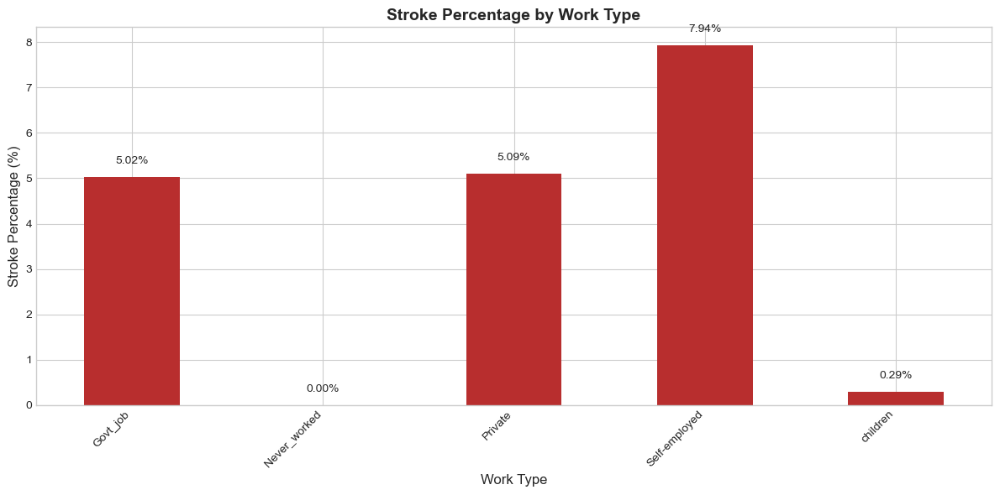

In [16]:
# 13. WORK TYPE ANALYSIS
# =================
print("\n13. Work Type Analysis")

# Visualize stroke percentage by work type
work_stroke_pct = df.groupby('work_type')['stroke'].mean() * 100

plt.figure(figsize=(12, 6))
ax = work_stroke_pct.plot(kind='bar', figsize=(12, 6), color=colors[8])
ax.set_xlabel('Work Type', fontsize=12)
ax.set_ylabel('Stroke Percentage (%)', fontsize=12)
ax.set_title('Stroke Percentage by Work Type', fontsize=14, fontweight='bold')

# Add percentage labels on top of bars
for i, v in enumerate(work_stroke_pct):
    ax.text(i, v + 0.3, f'{v:.2f}%', ha='center', fontsize=10)

plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


14. Multivariate Analysis


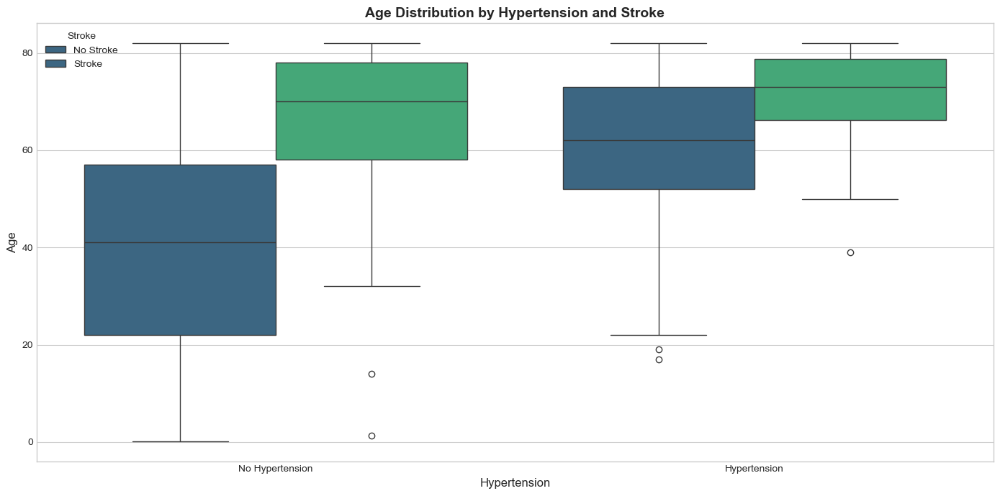

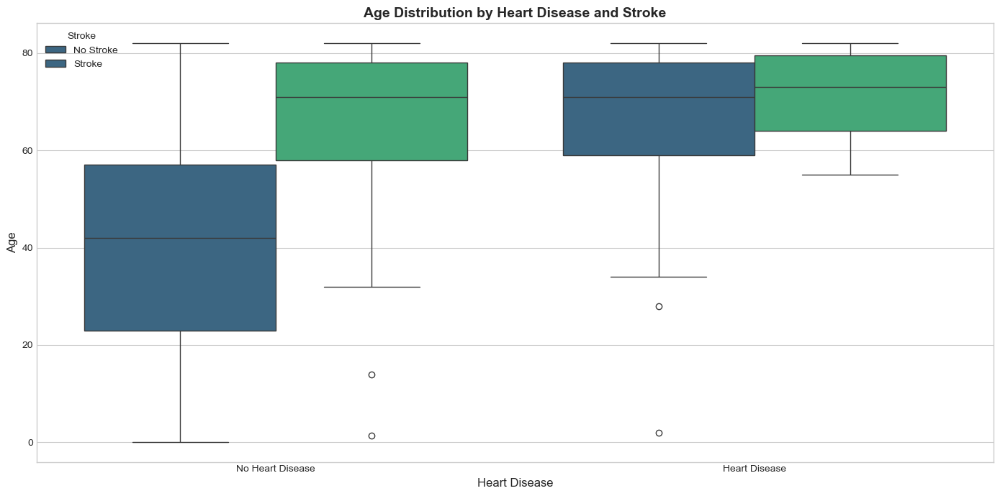

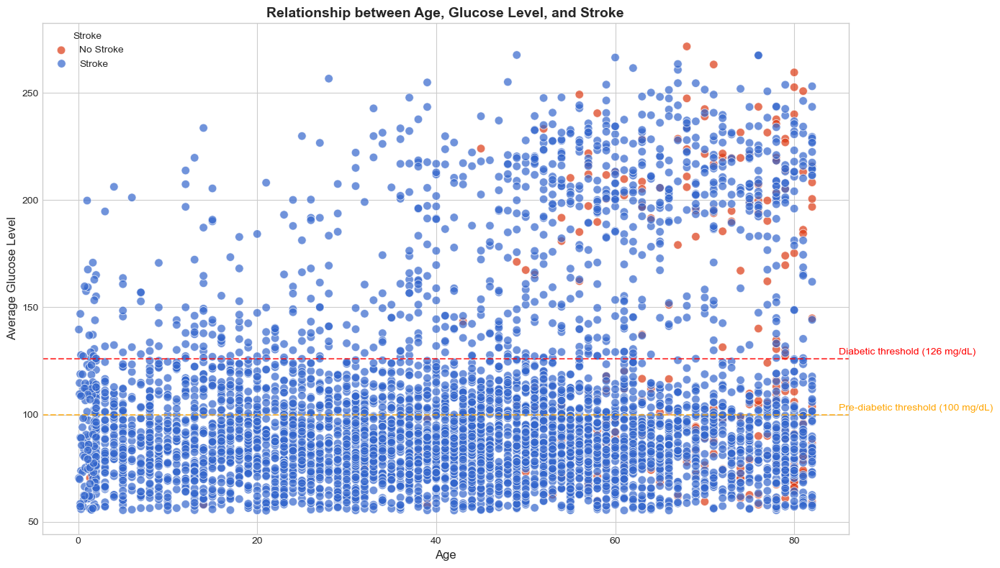

In [17]:
# 14. MULTIVARIATE ANALYSIS
# =====================
print("\n14. Multivariate Analysis")

# Age, hypertension, and stroke
plt.figure(figsize=(14, 7))
sns.boxplot(data=df, x='hypertension', y='age', hue='stroke', palette='viridis')
plt.title('Age Distribution by Hypertension and Stroke', fontsize=14, fontweight='bold')
plt.xlabel('Hypertension', fontsize=12)
plt.ylabel('Age', fontsize=12)
plt.legend(title='Stroke', labels=['No Stroke', 'Stroke'])
plt.xticks([0, 1], ['No Hypertension', 'Hypertension'])
plt.tight_layout()
plt.show()

# Age, heart disease, and stroke
plt.figure(figsize=(14, 7))
sns.boxplot(data=df, x='heart_disease', y='age', hue='stroke', palette='viridis')
plt.title('Age Distribution by Heart Disease and Stroke', fontsize=14, fontweight='bold')
plt.xlabel('Heart Disease', fontsize=12)
plt.ylabel('Age', fontsize=12)
plt.legend(title='Stroke', labels=['No Stroke', 'Stroke'])
plt.xticks([0, 1], ['No Heart Disease', 'Heart Disease'])
plt.tight_layout()
plt.show()

# Age, glucose level, and stroke
plt.figure(figsize=(14, 8))
scatter = sns.scatterplot(data=df, x='age', y='avg_glucose_level', hue='stroke', 
                         palette={0: colors[0], 1: colors[1]}, alpha=0.7, s=70)
plt.title('Relationship between Age, Glucose Level, and Stroke', fontsize=14, fontweight='bold')
plt.xlabel('Age', fontsize=12)
plt.ylabel('Average Glucose Level', fontsize=12)
plt.legend(title='Stroke', labels=['No Stroke', 'Stroke'])

# Add decision boundaries
plt.axhline(y=126, color='red', linestyle='--', alpha=0.7)
plt.text(85, 128, 'Diabetic threshold (126 mg/dL)', color='red')
plt.axhline(y=100, color='orange', linestyle='--', alpha=0.7)
plt.text(85, 102, 'Pre-diabetic threshold (100 mg/dL)', color='orange')

plt.tight_layout()
plt.show()


15. Feature Engineering Visualization


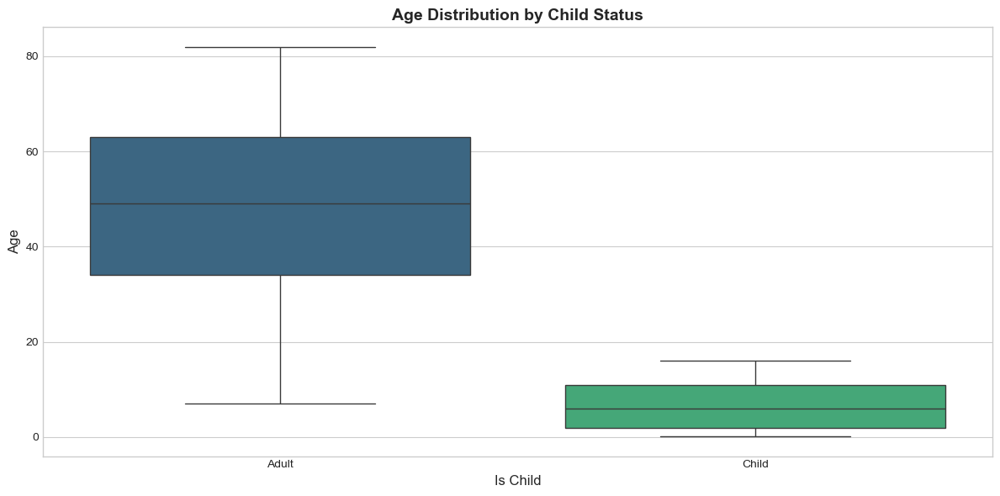

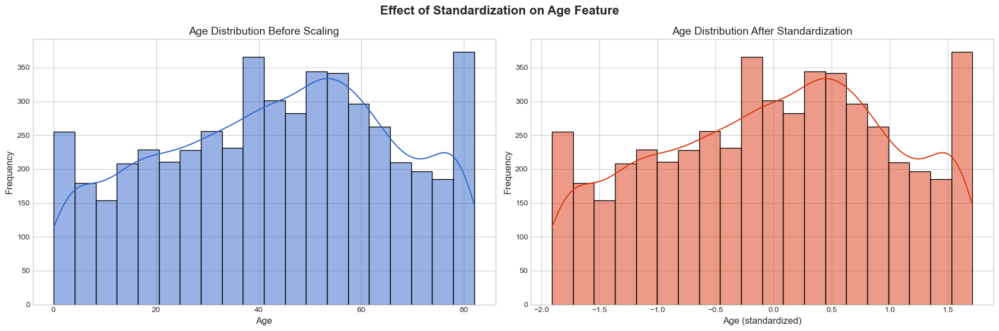

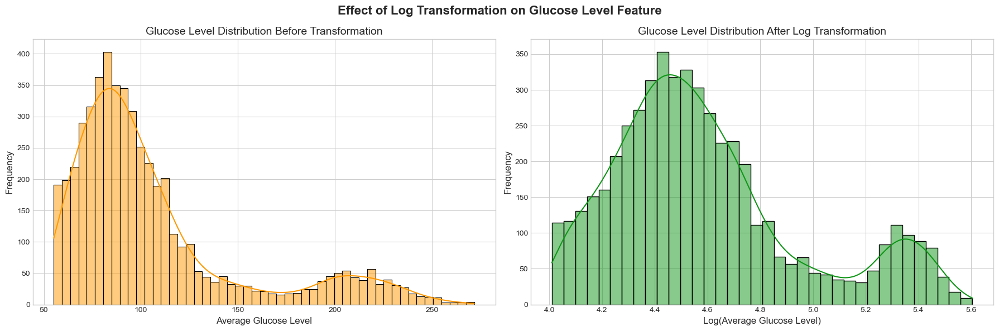

In [18]:
# 15. FEATURE ENGINEERING VISUALIZATION
# ================================
print("\n15. Feature Engineering Visualization")

# 15.1. Work type - children vs others
# Create a new feature for work_type with children as a special category
df['is_child'] = df['work_type'].apply(lambda x: 1 if x == 'children' else 0)

# Visualize age distribution by is_child
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='is_child', y='age', palette='viridis')
plt.title('Age Distribution by Child Status', fontsize=14, fontweight='bold')
plt.xlabel('Is Child', fontsize=12)
plt.ylabel('Age', fontsize=12)
plt.xticks([0, 1], ['Adult', 'Child'])
plt.tight_layout()
plt.show()

# 15.2. Standardization of numerical features
# Create a copy for transformation
df_scaled = df.copy()

# Select numerical features for scaling
features_to_scale = ['age', 'avg_glucose_level']
df_scaled_subset = df_scaled[features_to_scale].copy()

# Apply standardization
scaler = StandardScaler()
df_scaled[features_to_scale] = scaler.fit_transform(df_scaled_subset)

# Visualization before and after scaling for age
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Before scaling
sns.histplot(data=df, x='age', kde=True, ax=axes[0], color=colors[0])
axes[0].set_title('Age Distribution Before Scaling', fontsize=14)
axes[0].set_xlabel('Age', fontsize=12)
axes[0].set_ylabel('Frequency', fontsize=12)

# After scaling
sns.histplot(data=df_scaled, x='age', kde=True, ax=axes[1], color=colors[1])
axes[1].set_title('Age Distribution After Standardization', fontsize=14)
axes[1].set_xlabel('Age (standardized)', fontsize=12)
axes[1].set_ylabel('Frequency', fontsize=12)

plt.suptitle('Effect of Standardization on Age Feature', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# 15.3. Visualization of glucose level before and after log transformation
# Apply log transformation to glucose level to handle skewness
df['log_glucose'] = np.log(df['avg_glucose_level'])

fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Before transformation
sns.histplot(data=df, x='avg_glucose_level', kde=True, ax=axes[0], color=colors[2])
axes[0].set_title('Glucose Level Distribution Before Transformation', fontsize=14)
axes[0].set_xlabel('Average Glucose Level', fontsize=12)
axes[0].set_ylabel('Frequency', fontsize=12)

# After log transformation
sns.histplot(data=df, x='log_glucose', kde=True, ax=axes[1], color=colors[3])
axes[1].set_title('Glucose Level Distribution After Log Transformation', fontsize=14)
axes[1].set_xlabel('Log(Average Glucose Level)', fontsize=12)
axes[1].set_ylabel('Frequency', fontsize=12)

plt.suptitle('Effect of Log Transformation on Glucose Level Feature', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()


16. Addressing Class Imbalance Visualization
Checking column data types:
Column 'gender' has object type with values: ['Male' 'Female' 'Other']
Column 'ever_married' has object type with values: ['Yes' 'No']
Column 'work_type' has object type with values: ['Private' 'Self-employed' 'Govt_job' 'children' 'Never_worked']
Column 'Residence_type' has object type with values: ['Urban' 'Rural']
Column 'smoking_status' has object type with values: ['formerly smoked' 'never smoked' 'smokes' 'Unknown']
Column 'age_group' has category type with values: ['61-70', '71+', '41-50', '51-60', '31-40', '0-18', '19-30']
Categories (7, object): ['0-18' < '19-30' < '31-40' < '41-50' < '51-60' < '61-70' < '71+']
Column 'glucose_category' has category type with values: ['Diabetic', 'Pre-diabetic', 'Normal', 'Low']
Categories (4, object): ['Low' < 'Normal' < 'Pre-diabetic' < 'Diabetic']
Encoding object column: gender
After encoding, values are: [1 0 2]
Encoding object column: ever_married
After encoding, va

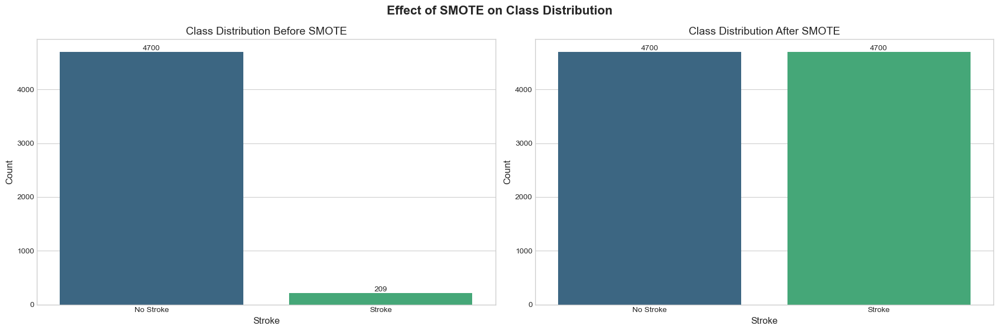

In [19]:
# 16. ADDRESSING CLASS IMBALANCE VISUALIZATION
# ======================================
print("\n16. Addressing Class Imbalance Visualization")
# Prepare data for SMOTE
# Handle missing values first
df_no_missing = df.dropna()

# Select features and target
X = df_no_missing.drop(['id', 'stroke'], axis=1)
y = df_no_missing['stroke']

# First, identify columns with non-numeric data
print("Checking column data types:")
for col in X.columns:
    if X[col].dtype == 'object' or pd.api.types.is_categorical_dtype(X[col]):
        print(f"Column '{col}' has {X[col].dtype} type with values: {X[col].unique()}")

# Encode categorical variables for SMOTE
cat_cols = ['gender', 'ever_married', 'work_type', 'Residence_type', 'smoking_status']
X_encoded = X.copy()

# Handle categorical columns properly, including category dtypes
for col in X_encoded.columns:
    if pd.api.types.is_categorical_dtype(X_encoded[col]):
        print(f"Converting categorical column '{col}' to codes")
        # For category type, convert to codes which are numeric
        X_encoded[col] = X_encoded[col].cat.codes
        print(f"After conversion, {col} values: {X_encoded[col].unique()}")
    elif X_encoded[col].dtype == 'object':
        print(f"Encoding object column: {col}")
        le = LabelEncoder()
        X_encoded[col] = le.fit_transform(X_encoded[col].astype(str))
        print(f"After encoding, values are: {X_encoded[col].unique()}")

# Check for any remaining non-numeric columns
for col in X_encoded.columns:
    if not pd.api.types.is_numeric_dtype(X_encoded[col]):
        print(f"WARNING: Column {col} is still not numeric: {X_encoded[col].dtype}")
        # Try to force convert
        X_encoded[col] = pd.to_numeric(X_encoded[col], errors='coerce')
        # Fill NaN values with median for numeric columns
        if X_encoded[col].isna().any():
            median_val = X_encoded[col].median()
            if pd.isna(median_val):  # If median is also NaN, use 0
                X_encoded[col].fillna(0, inplace=True)
            else:
                X_encoded[col].fillna(median_val, inplace=True)
            print(f"Filled NaN values in {col} with {median_val}")

# Final check for any remaining NaN values
if X_encoded.isna().any().any():
    print("WARNING: There are still NaN values in the dataset")
    # Get columns with NaN values
    nan_cols = X_encoded.columns[X_encoded.isna().any()].tolist()
    print(f"Columns with NaN values: {nan_cols}")
    
    # Fill remaining NaN values with column median or 0
    for col in nan_cols:
        median_val = X_encoded[col].median()
        if pd.isna(median_val):  # If median is also NaN, use 0
            X_encoded[col] = X_encoded[col].fillna(0)
            print(f"Filled NaN values in {col} with 0")
        else:
            X_encoded[col] = X_encoded[col].fillna(median_val)
            print(f"Filled NaN values in {col} with median: {median_val}")

# Verify no NaN values remain
assert not X_encoded.isna().any().any(), "NaN values still exist after filling"

print("Final encoded data types:")
print(X_encoded.dtypes)

# Apply SMOTE
smote = SMOTE(random_state=42)
X_smote, y_smote = smote.fit_resample(X_encoded, y)

# Compare class distribution before and after SMOTE
fig, axes = plt.subplots(1, 2, figsize=(18, 6))
# Before SMOTE
sns.countplot(x=y, ax=axes[0], palette='viridis')
axes[0].set_title('Class Distribution Before SMOTE', fontsize=14)
axes[0].set_xlabel('Stroke', fontsize=12)
axes[0].set_ylabel('Count', fontsize=12)
axes[0].set_xticklabels(['No Stroke', 'Stroke'])
# Add count labels
for p in axes[0].patches:
    axes[0].annotate(f'{int(p.get_height())}', 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha = 'center', va = 'bottom', fontsize=10)
# After SMOTE
sns.countplot(x=y_smote, ax=axes[1], palette='viridis')
axes[1].set_title('Class Distribution After SMOTE', fontsize=14)
axes[1].set_xlabel('Stroke', fontsize=12)
axes[1].set_ylabel('Count', fontsize=12)
axes[1].set_xticklabels(['No Stroke', 'Stroke'])
# Add count labels for the "After SMOTE" plot
for p in axes[1].patches:
    axes[1].annotate(f'{int(p.get_height())}', 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha = 'center', va = 'bottom', fontsize=10)
plt.suptitle('Effect of SMOTE on Class Distribution', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()


17. Creating Summary Chart - Top Factors


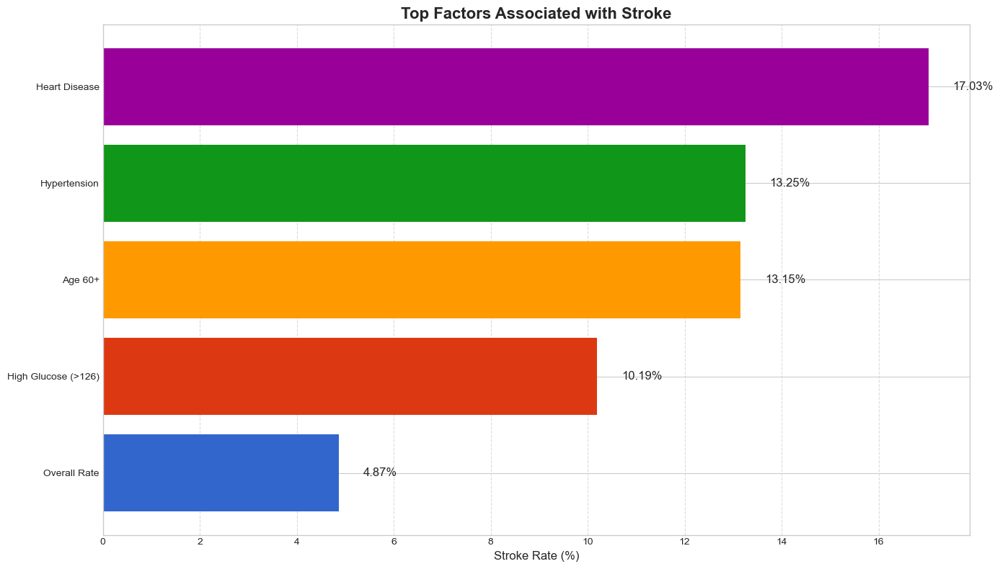

In [20]:
# 17. SUMMARY CHART - TOP FACTORS ASSOCIATED WITH STROKE
# =================================================
print("\n17. Creating Summary Chart - Top Factors")

# Calculate average stroke rate for different factors
age_60_plus = df[df['age'] >= 60]['stroke'].mean() * 100
hypertension = df[df['hypertension'] == 1]['stroke'].mean() * 100
heart_disease = df[df['heart_disease'] == 1]['stroke'].mean() * 100
high_glucose = df[df['avg_glucose_level'] > 126]['stroke'].mean() * 100
overall_rate = df['stroke'].mean() * 100

# Create summary data
summary_data = pd.DataFrame({
    'Factor': ['Overall Rate', 'Age 60+', 'Hypertension', 'Heart Disease', 'High Glucose (>126)'],
    'Stroke Rate (%)': [overall_rate, age_60_plus, hypertension, heart_disease, high_glucose]
})

# Sort by stroke rate descending
summary_data = summary_data.sort_values('Stroke Rate (%)', ascending=True)

# Plot summary
plt.figure(figsize=(14, 8))
bars = plt.barh(summary_data['Factor'], summary_data['Stroke Rate (%)'], color=colors[:5])
plt.xlabel('Stroke Rate (%)', fontsize=12)
plt.title('Top Factors Associated with Stroke', fontsize=16, fontweight='bold')
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Add stroke rate values
for i, bar in enumerate(bars):
    plt.text(bar.get_width() + 0.5, 
             bar.get_y() + bar.get_height()/2, 
             f'{summary_data["Stroke Rate (%)"].iloc[i]:.2f}%', 
             va='center', fontsize=12)

plt.tight_layout()
plt.show()



18. Interactive Plotly Visualizations


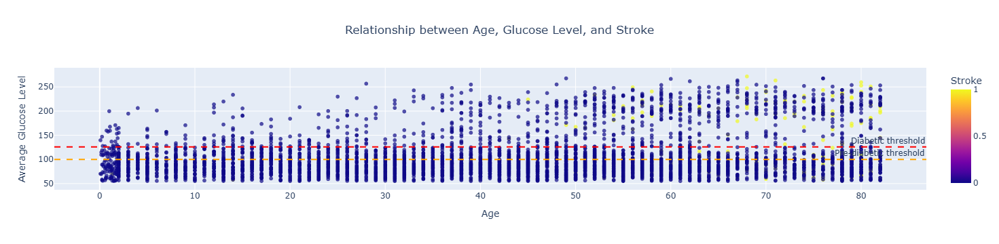

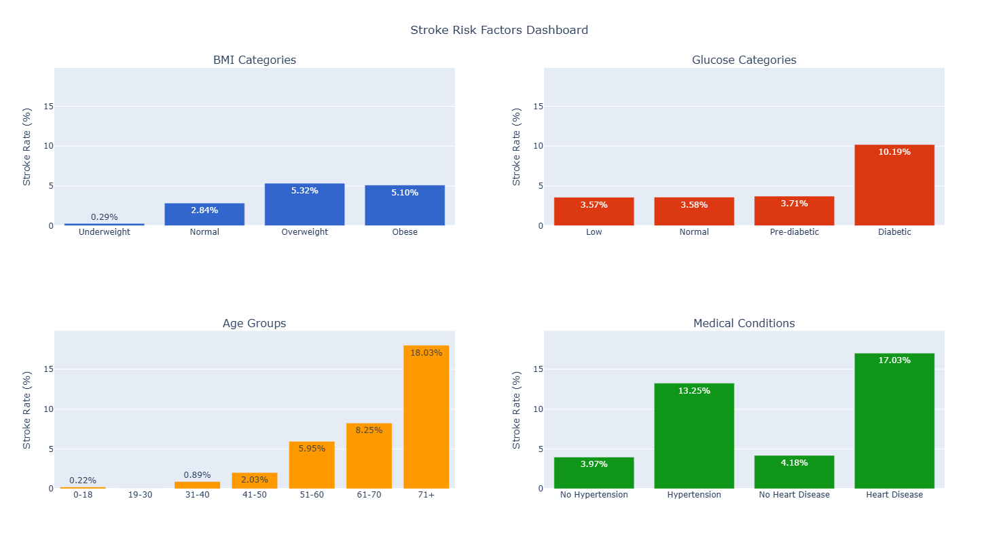

In [21]:
# 18. INTERACTIVE VISUALIZATIONS WITH PLOTLY
# ======================================
print("\n18. Interactive Plotly Visualizations")

# 18.1 Interactive stroke distribution pie chart
fig = px.pie(
    names=['No Stroke', 'Stroke'],
    values=stroke_counts.values,
    title='Stroke Distribution',
    color_discrete_sequence=px.colors.sequential.Viridis,
    hole=0.4
)
fig.update_traces(textinfo='percent+value', textposition='inside')
fig.update_layout(title_x=0.5)
fig.show()

# 18.2 Interactive age vs glucose scatter with hover information
fig = px.scatter(
    df, x='age', y='avg_glucose_level', color='stroke',
    color_discrete_sequence=['#3498db', '#e74c3c'],
    opacity=0.7, size_max=10,
    hover_data=['gender', 'hypertension', 'heart_disease', 'bmi'],
    title='Relationship between Age, Glucose Level, and Stroke',
    labels={'age': 'Age', 'avg_glucose_level': 'Average Glucose Level', 'stroke': 'Stroke'}
)

# Add reference lines for glucose thresholds
fig.add_hline(y=126, line_dash="dash", line_color="red", annotation_text="Diabetic threshold")
fig.add_hline(y=100, line_dash="dash", line_color="orange", annotation_text="Pre-diabetic threshold")

fig.update_layout(
    title_x=0.5,
    legend_title="Stroke",
    xaxis_title="Age",
    yaxis_title="Average Glucose Level"
)
fig.show()

# 18.3 Interactive choropleth map of risk factors
# Create subplot with 2x2 grid
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=("BMI Categories", "Glucose Categories", 
                   "Age Groups", "Medical Conditions"),
    specs=[[{"type": "bar"}, {"type": "bar"}],
           [{"type": "bar"}, {"type": "bar"}]]
)

# BMI Categories
bmi_data = df_bmi.groupby('bmi_category')['stroke'].mean() * 100
fig.add_trace(
    go.Bar(
        x=bmi_data.index,
        y=bmi_data.values,
        text=[f'{v:.2f}%' for v in bmi_data.values],
        textposition='auto',
        marker_color=colors[0],
        name='BMI'
    ),
    row=1, col=1
)

# Glucose Categories
glucose_data = df.groupby('glucose_category')['stroke'].mean() * 100
fig.add_trace(
    go.Bar(
        x=glucose_data.index,
        y=glucose_data.values,
        text=[f'{v:.2f}%' for v in glucose_data.values],
        textposition='auto',
        marker_color=colors[1],
        name='Glucose'
    ),
    row=1, col=2
)

# Age Groups
age_data = df.groupby('age_group')['stroke'].mean() * 100
fig.add_trace(
    go.Bar(
        x=age_data.index,
        y=age_data.values,
        text=[f'{v:.2f}%' for v in age_data.values],
        textposition='auto',
        marker_color=colors[2],
        name='Age'
    ),
    row=2, col=1
)

# Medical Conditions
conditions_data = pd.DataFrame({
    'Condition': ['No Hypertension', 'Hypertension', 'No Heart Disease', 'Heart Disease'],
    'Stroke Rate': [
        df[df['hypertension'] == 0]['stroke'].mean() * 100,
        df[df['hypertension'] == 1]['stroke'].mean() * 100,
        df[df['heart_disease'] == 0]['stroke'].mean() * 100,
        df[df['heart_disease'] == 1]['stroke'].mean() * 100
    ]
})
fig.add_trace(
    go.Bar(
        x=conditions_data['Condition'],
        y=conditions_data['Stroke Rate'],
        text=[f'{v:.2f}%' for v in conditions_data['Stroke Rate']],
        textposition='auto',
        marker_color=colors[3],
        name='Conditions'
    ),
    row=2, col=2
)

# Update layout
fig.update_layout(
    title_text="Stroke Risk Factors Dashboard",
    height=800,
    showlegend=False,
    title_x=0.5
)

# Update y-axis labels
fig.update_yaxes(title_text="Stroke Rate (%)", range=[0, max(age_data.max(), glucose_data.max(), 
                                                            bmi_data.max(), conditions_data['Stroke Rate'].max()) * 1.1])

fig.show()


19. Advanced Multivariate Visualization


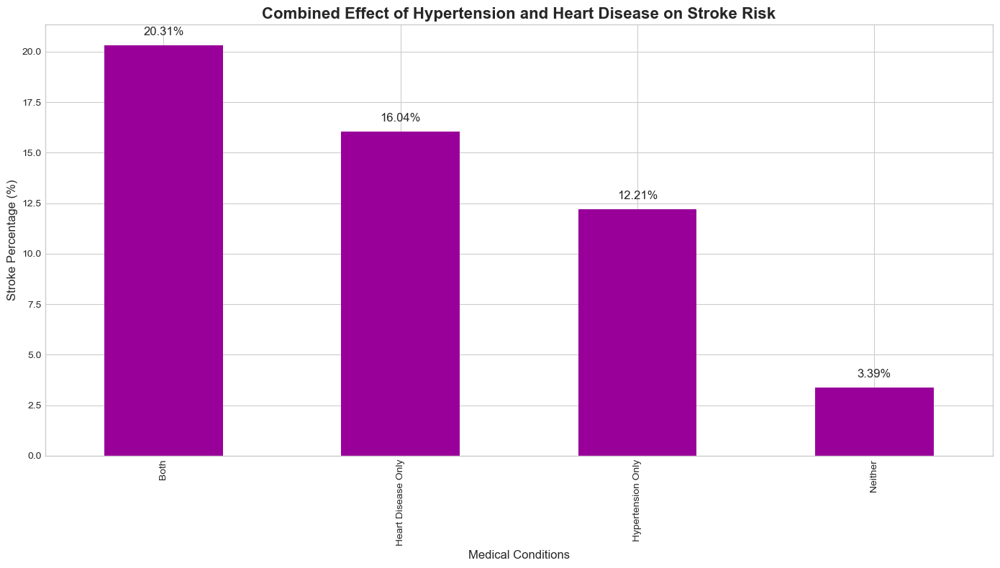

In [22]:
# 19. ADVANCED MULTIVARIATE VISUALIZATION
# ==================================
print("\n19. Advanced Multivariate Visualization")

# Create a combined feature for both hypertension and heart disease
df['combined_conditions'] = df.apply(
    lambda row: 'Both' if row['hypertension'] == 1 and row['heart_disease'] == 1 
    else 'Hypertension Only' if row['hypertension'] == 1 
    else 'Heart Disease Only' if row['heart_disease'] == 1 
    else 'Neither', axis=1
)

# Visualize the combined effect on stroke
plt.figure(figsize=(14, 8))
combined_stroke_pct = df.groupby('combined_conditions')['stroke'].mean() * 100

# Sort by stroke percentage (highest to lowest)
combined_stroke_pct = combined_stroke_pct.sort_values(ascending=False)

ax = combined_stroke_pct.plot(kind='bar', figsize=(14, 8), color=colors[4])
ax.set_xlabel('Medical Conditions', fontsize=12)
ax.set_ylabel('Stroke Percentage (%)', fontsize=12)
ax.set_title('Combined Effect of Hypertension and Heart Disease on Stroke Risk', 
             fontsize=16, fontweight='bold')

# Add percentage labels
for i, v in enumerate(combined_stroke_pct):
    ax.text(i, v + 0.5, f'{v:.2f}%', ha='center', fontsize=12)

plt.tight_layout()
plt.show()

# Interactive version with Plotly
fig = px.bar(
    x=combined_stroke_pct.index,
    y=combined_stroke_pct.values,
    text=[f'{v:.2f}%' for v in combined_stroke_pct.values],
    title='Combined Effect of Hypertension and Heart Disease on Stroke Risk',
    labels={'x': 'Medical Conditions', 'y': 'Stroke Percentage (%)'},
    color=combined_stroke_pct.values,
    color_continuous_scale='Viridis'
)
fig.update_layout(title_x=0.5)
fig.show()


20. Risk Prediction Visualization


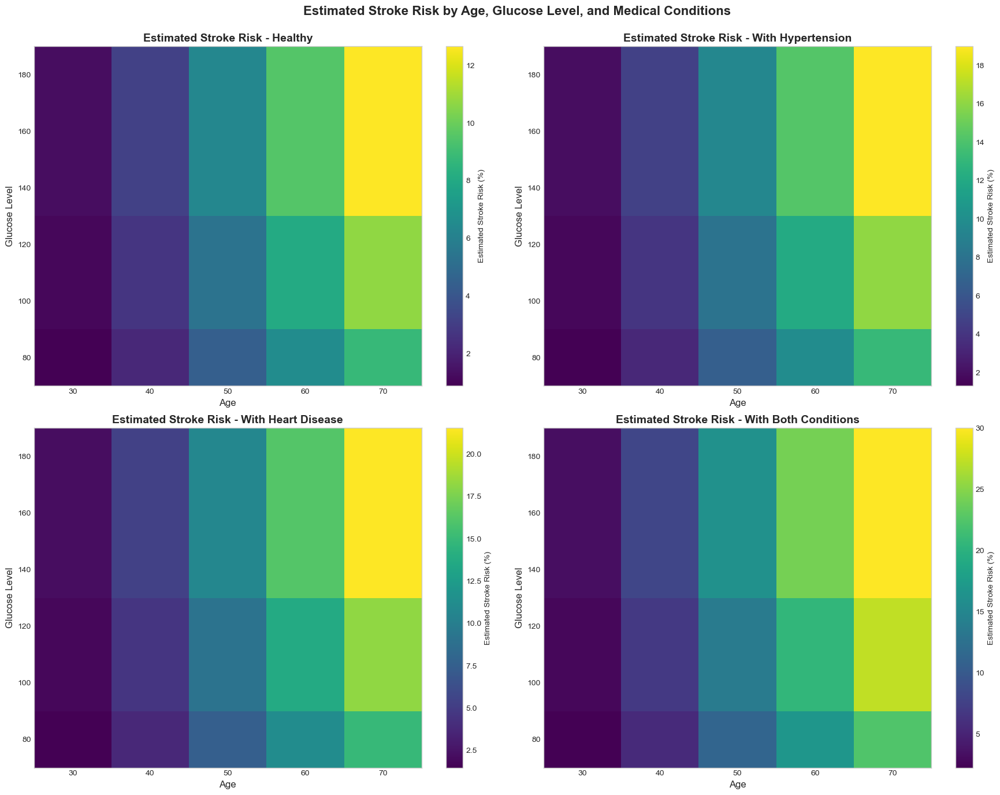

In [23]:
# 20. RISK PREDICTION VISUALIZATION
# ===========================
print("\n20. Risk Prediction Visualization")

# Create a function to calculate estimated stroke risk based on key factors
def estimate_stroke_risk(age, hypertension, heart_disease, glucose_level):
    # Apply a simple weighted model based on our analysis
    # These weights are simplified for visualization purposes
    base_rate = df['stroke'].mean() * 100  # baseline rate
    
    # Age factor (increases risk with age)
    if age < 40:
        age_factor = 0.2
    elif age < 50:
        age_factor = 0.5
    elif age < 60:
        age_factor = 1.0
    elif age < 70:
        age_factor = 1.5
    else:
        age_factor = 2.0
        
    # Hypertension factor
    htn_factor = 1.5 if hypertension else 1.0
    
    # Heart disease factor
    hd_factor = 1.7 if heart_disease else 1.0
    
    # Glucose level factor
    if glucose_level < 100:
        glucose_factor = 0.9
    elif glucose_level < 126:
        glucose_factor = 1.1
    else:
        glucose_factor = 1.3
        
    # Calculate combined risk
    risk = base_rate * age_factor * htn_factor * hd_factor * glucose_factor
    
    # Cap the risk at a reasonable maximum
    return min(risk, 30.0)

# Create a grid of values to visualize
ages = np.arange(30, 80, 10)
glucose_levels = np.arange(80, 200, 20)
age_grid, glucose_grid = np.meshgrid(ages, glucose_levels)

# Calculate risk for each combination (without hypertension or heart disease)
risk_grid_healthy = np.array([[estimate_stroke_risk(age, 0, 0, glucose) 
                              for age in ages] 
                              for glucose in glucose_levels])

# Calculate risk with hypertension
risk_grid_htn = np.array([[estimate_stroke_risk(age, 1, 0, glucose) 
                          for age in ages] 
                          for glucose in glucose_levels])

# Calculate risk with heart disease
risk_grid_hd = np.array([[estimate_stroke_risk(age, 0, 1, glucose) 
                         for age in ages] 
                         for glucose in glucose_levels])

# Calculate risk with both conditions
risk_grid_both = np.array([[estimate_stroke_risk(age, 1, 1, glucose) 
                           for age in ages] 
                           for glucose in glucose_levels])

# Create heatmap for healthy individuals
fig, axes = plt.subplots(2, 2, figsize=(18, 14))

# Healthy (no hypertension, no heart disease)
im0 = axes[0, 0].pcolormesh(age_grid, glucose_grid, risk_grid_healthy, 
                          cmap='viridis', shading='auto')
axes[0, 0].set_title('Estimated Stroke Risk - Healthy', fontsize=14, fontweight='bold')
axes[0, 0].set_xlabel('Age', fontsize=12)
axes[0, 0].set_ylabel('Glucose Level', fontsize=12)
fig.colorbar(im0, ax=axes[0, 0], label='Estimated Stroke Risk (%)')

# With hypertension
im1 = axes[0, 1].pcolormesh(age_grid, glucose_grid, risk_grid_htn, 
                          cmap='viridis', shading='auto')
axes[0, 1].set_title('Estimated Stroke Risk - With Hypertension', fontsize=14, fontweight='bold')
axes[0, 1].set_xlabel('Age', fontsize=12)
axes[0, 1].set_ylabel('Glucose Level', fontsize=12)
fig.colorbar(im1, ax=axes[0, 1], label='Estimated Stroke Risk (%)')

# With heart disease
im2 = axes[1, 0].pcolormesh(age_grid, glucose_grid, risk_grid_hd, 
                          cmap='viridis', shading='auto')
axes[1, 0].set_title('Estimated Stroke Risk - With Heart Disease', fontsize=14, fontweight='bold')
axes[1, 0].set_xlabel('Age', fontsize=12)
axes[1, 0].set_ylabel('Glucose Level', fontsize=12)
fig.colorbar(im2, ax=axes[1, 0], label='Estimated Stroke Risk (%)')

# With both conditions
im3 = axes[1, 1].pcolormesh(age_grid, glucose_grid, risk_grid_both, 
                          cmap='viridis', shading='auto')
axes[1, 1].set_title('Estimated Stroke Risk - With Both Conditions', fontsize=14, fontweight='bold')
axes[1, 1].set_xlabel('Age', fontsize=12)
axes[1, 1].set_ylabel('Glucose Level', fontsize=12)
fig.colorbar(im3, ax=axes[1, 1], label='Estimated Stroke Risk (%)')

plt.suptitle('Estimated Stroke Risk by Age, Glucose Level, and Medical Conditions', 
             fontsize=16, fontweight='bold')
plt.tight_layout()
plt.subplots_adjust(top=0.93)
plt.show()

# Interactive 3D surface plot with Plotly
fig = go.Figure(data=[go.Surface(z=risk_grid_both, x=ages, y=glucose_levels)])
fig.update_layout(
    title='3D Stroke Risk Surface (With Both Conditions)',
    scene=dict(
        xaxis_title='Age',
        yaxis_title='Glucose Level',
        zaxis_title='Stroke Risk (%)'
    ),
    width=800,
    height=800
)
fig.show()


21. Conclusion and Summary Visualizations


<Figure size 1500x1000 with 0 Axes>

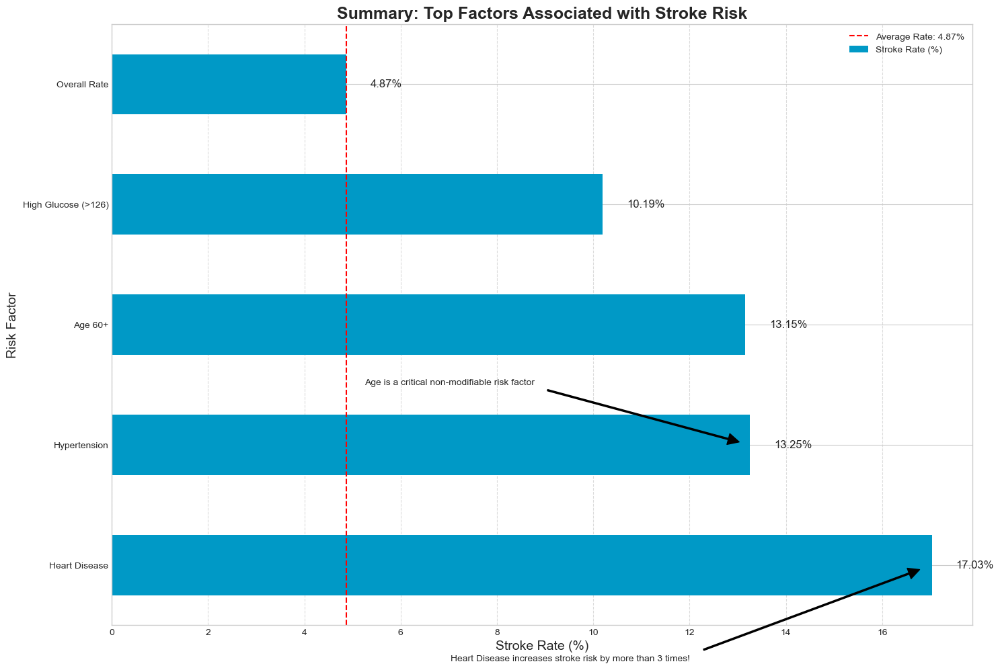

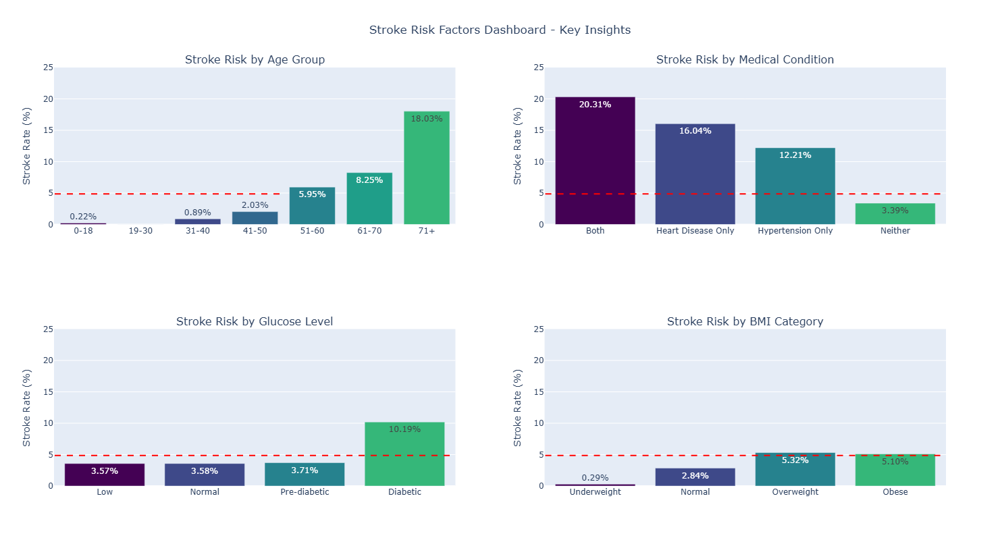


The visualizations provide comprehensive insights into stroke risk factors.


In [24]:
# 21. CONCLUSION AND SUMMARY VISUALIZATIONS
# ====================================
print("\n21. Conclusion and Summary Visualizations")

# Create a figure for the summary
plt.figure(figsize=(15, 10))

# Plot the top factors summary
summary_data_sorted = summary_data.sort_values('Stroke Rate (%)', ascending=False)
ax = summary_data_sorted.plot(kind='barh', x='Factor', y='Stroke Rate (%)', 
                            figsize=(15, 10), color=colors[5])
ax.set_xlabel('Stroke Rate (%)', fontsize=14)
ax.set_ylabel('Risk Factor', fontsize=14)
ax.set_title('Summary: Top Factors Associated with Stroke Risk', 
             fontsize=18, fontweight='bold')

# Add percentage labels
for i, v in enumerate(summary_data_sorted['Stroke Rate (%)']):
    ax.text(v + 0.5, i, f'{v:.2f}%', va='center', fontsize=12)

# Add a red line for average stroke rate
avg_rate = df['stroke'].mean() * 100
plt.axvline(x=avg_rate, color='r', linestyle='--', label=f'Average Rate: {avg_rate:.2f}%')
plt.legend()

# Add annotations with key insights
plt.annotate('Heart Disease increases stroke risk by more than 3 times!', 
             xy=(summary_data_sorted.iloc[0]['Stroke Rate (%)'], 0), 
             xytext=(summary_data_sorted.iloc[0]['Stroke Rate (%)'] - 10, -0.8),
             arrowprops=dict(facecolor='black', shrink=0.05, width=1.5))

plt.annotate('Age is a critical non-modifiable risk factor', 
             xy=(summary_data_sorted.iloc[1]['Stroke Rate (%)'], 1), 
             xytext=(summary_data_sorted.iloc[1]['Stroke Rate (%)'] - 8, 1.5),
             arrowprops=dict(facecolor='black', shrink=0.05, width=1.5))

plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Create final interactive dashboard with plotly
# This combines multiple insights into one view
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=(
        "Stroke Risk by Age Group", 
        "Stroke Risk by Medical Condition",
        "Stroke Risk by Glucose Level", 
        "Stroke Risk by BMI Category"
    ),
    specs=[[{"type": "bar"}, {"type": "bar"}],
           [{"type": "bar"}, {"type": "bar"}]]
)

# Age Groups
fig.add_trace(
    go.Bar(
        x=age_stroke_pct.index,
        y=age_stroke_pct.values,
        marker_color=px.colors.sequential.Viridis[::len(px.colors.sequential.Viridis)//len(age_stroke_pct)],
        text=[f'{v:.2f}%' for v in age_stroke_pct.values],
        textposition='auto',
    ),
    row=1, col=1
)

# Medical Conditions
fig.add_trace(
    go.Bar(
        x=combined_stroke_pct.index,
        y=combined_stroke_pct.values,
        marker_color=px.colors.sequential.Viridis[::len(px.colors.sequential.Viridis)//len(combined_stroke_pct)],
        text=[f'{v:.2f}%' for v in combined_stroke_pct.values],
        textposition='auto',
    ),
    row=1, col=2
)

# Glucose Levels
fig.add_trace(
    go.Bar(
        x=glucose_stroke_pct.index,
        y=glucose_stroke_pct.values,
        marker_color=px.colors.sequential.Viridis[::len(px.colors.sequential.Viridis)//len(glucose_stroke_pct)],
        text=[f'{v:.2f}%' for v in glucose_stroke_pct.values],
        textposition='auto',
    ),
    row=2, col=1
)

# BMI Categories
fig.add_trace(
    go.Bar(
        x=bmi_stroke_pct.index,
        y=bmi_stroke_pct.values,
        marker_color=px.colors.sequential.Viridis[::len(px.colors.sequential.Viridis)//len(bmi_stroke_pct)],
        text=[f'{v:.2f}%' for v in bmi_stroke_pct.values],
        textposition='auto',
    ),
    row=2, col=2
)

# Add a horizontal line showing the average stroke rate across all charts
for i in range(1, 3):
    for j in range(1, 3):
        fig.add_shape(
            type="line",
            x0=-0.5,
            y0=avg_rate,
            x1=3.5,
            y1=avg_rate,
            line=dict(color="red", width=2, dash="dash"),
            row=i, col=j
        )

# Update y-axis range to be consistent and add labels
for i in range(1, 3):
    for j in range(1, 3):
        fig.update_yaxes(title_text="Stroke Rate (%)", range=[0, 25], row=i, col=j)

# Update layout
fig.update_layout(
    title_text="Stroke Risk Factors Dashboard - Key Insights",
    showlegend=False,
    height=800,
    width=1200,
    title_x=0.5
)

fig.show()

print("\nThe visualizations provide comprehensive insights into stroke risk factors.")